# **Project Name**    - Netflix Movies and TV Shows Clustering Unsupervised ML



##### **Project Type**    -  Clustering Unsupervised ML
##### **Contribution**    - Individual
##### **Team Member 1 -**   Dharmesh Gadhiya

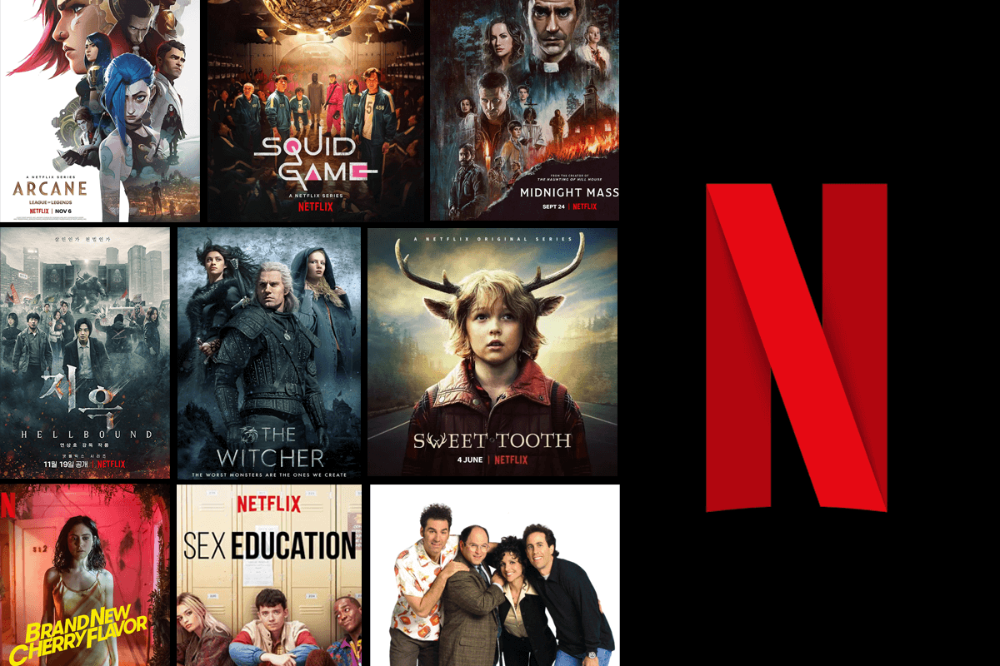

# **Project Summary -**

This dataset consists of TV shows and movies available on Netflix as of 2019. The dataset is collected from Flixable which is a third-party Netflix search engine. In 2018, they released an interesting report which shows that the number of TV shows on Netflix has nearly tripled since 2010. The streaming service’s number of movies has decreased by more than 2,000 titles since 2010, while its number of TV shows has nearly tripled. It will be interesting to explore what all other insights can be obtained from the same dataset.

This project applies unsupervised machine learning techniques to analyze and cluster the Netflix Movies and TV Shows dataset. By **leveraging NLP-based textual preprocessing and clustering algorithms like K-Means and Agglomerative Hierarchical Clustering**, we uncover meaningful groupings within the content based on metadata such as titles, descriptions, country, rating, genres, and cast. The project also includes the development of a basic **content-based recommendation system to enhance user experience and engagement on the platform**.



# **GitHub Link -**

*https://github.com/Dharmeshgadhiya161/Netflix-Movies-and-TV-Shows-Clustering-Unsupervised-ML*

# **Problem Statement**


Netflix provides thousands of titles spanning different genres, countries, and types (movies and TV shows). Users often struggle to discover new content relevant to their preferences. Without proper categorization and content similarity mapping, it’s difficult to provide personalized recommendations or identify viewing trends.

**The problem:**
* Exploratory Data Analysis.
* Understanding what type content is available in different countries, Genre Distribution, Content Rating Analysis.
* How can we automatically cluster Netflix Movies and TV Shows based on their similarities using unsupervised learning?
* Can we use these clusters to recommend similar content, enhancing content discovery and user engagement?

# **General Guidelines** : -  

1.   Well-structured, formatted, and commented code is required.
2.   Exception Handling, Production Grade Code & Deployment Ready Code will be a plus. Those students will be awarded some additional credits.
     
     The additional credits will have advantages over other students during Star Student selection.
       
             [ Note: - Deployment Ready Code is defined as, the whole .ipynb notebook should be executable in one go
                       without a single error logged. ]

3.   Each and every logic should have proper comments.
4. You may add as many number of charts you want. Make Sure for each and every chart the following format should be answered.
        

```
# Chart visualization code
```
            

*   Why did you pick the specific chart?
*   What is/are the insight(s) found from the chart?
* Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

5. You have to create at least 15 logical & meaningful charts having important insights.


[ Hints : - Do the Vizualization in  a structured way while following "UBM" Rule.

U - Univariate Analysis,

B - Bivariate Analysis (Numerical - Categorical, Numerical - Numerical, Categorical - Categorical)

M - Multivariate Analysis
 ]





6. You may add more ml algorithms for model creation. Make sure for each and every algorithm, the following format should be answered.


*   Explain the ML Model used and it's performance using Evaluation metric Score Chart.


*   Cross- Validation & Hyperparameter Tuning

*   Have you seen any improvement? Note down the improvement with updates Evaluation metric Score Chart.

*   Explain each evaluation metric's indication towards business and the business impact pf the ML model used.




















# ***Let's Begin !***

## ***1. Know Your Data***

### Import Libraries

In [1]:
# Import Libraries
import pandas as pd # Data cleaning and data manipulation
import numpy as np  # Numerical computations and array operations

# Data Visualization
import matplotlib.pyplot as plt     # Basic plotting (line, bar, scatter, histogram, etc.)
import seaborn as sns               # Statistical data visualization (heatmaps, boxplots, etc.)
import plotly.express as px         # Interactive visualizations (scatter, line, pie charts, etc.)
# date and time data
import datetime
import missingno as msno
#To ignore warnings
import warnings
warnings.filterwarnings('ignore')

# WordCloud
from wordcloud import WordCloud # generating word cloud visualizations from text data
import re
#from nltk.corpus import stopwords

# Hypothesis testing
from scipy.stats import f_oneway     # One-way ANOVA test to compare means across multiple groups
from scipy.stats import ttest_ind    # Independent t-test to compare means between two groups
import scipy.stats as stats          # Access to various statistical tests and distributions (like, chi-square, normal dist.)

### Dataset Loading

In [2]:
# Mounting drive
from google.colab import drive       # Import Google Drive integration for Colab
drive.mount('/content/drive')        # Mount Google Drive to access files within Colab environment

Mounted at /content/drive


In [3]:
# Loading Dataset
# Load the Netflix dataset from Google Drive into a DataFrame
df_nmt = pd.read_csv("/content/drive/My Drive/Colab Notebooks/Module: Machine Learning/Capstone Project/NETFLIX MOVIES AND TV SHOWS CLUSTERING.csv")
#df_nmt=pd.read_csv("NETFLIX MOVIES AND TV SHOWS CLUSTERING.csv")


### Dataset First View

In [4]:
# Dataset First Look
df_nmt.head() # Top data view

,show_id,type,title,director,cast,country,date_added,release_year,rating,duration,listed_in,description
0,s1,TV Show,3%,NaN,"João Miguel, Bianca Comparato, Michel Gomes, R...",Brazil,"August 14, 2020",2020,TV-MA,4 Seasons,"International TV Shows, TV Dramas, TV Sci-Fi &...",In a future where the elite inhabit an island ...
1,s2,Movie,7:19,Jorge Michel Grau,"Demián Bichir, Héctor Bonilla, Oscar Serrano, ...",Mexico,"December 23, 2016",2016,TV-MA,93 min,"Dramas, International Movies",After a devastating earthquake hits Mexico Cit...
2,s3,Movie,23:59,Gilbert Chan,"Tedd Chan, Stella Chung, Henley Hii, Lawrence ...",Singapore,"December 20, 2018",2011,R,78 min,"Horror Movies, International Movies","When an army recruit is found dead, his fellow..."
3,s4,Movie,9,Shane Acker,"Elijah Wood, John C. Reilly, Jennifer Connelly...",United States,"November 16, 2017",2009,PG-13,80 min,"Action & Adventure, Independent Movies, Sci-Fi...","In a postapocalyptic world, rag-doll robots hi..."
4,s5,Movie,21,Robert Luketic,"Jim Sturgess, Kevin Spacey, Kate Bosworth, Aar...",United States,"January 1, 2020",2008,PG-13,123 min,Dramas,A brilliant group of students become card-coun...


In [5]:
df_nmt.tail() # bottom data view

,show_id,type,title,director,cast,country,date_added,release_year,rating,duration,listed_in,description
7782,s7783,Movie,Zozo,Josef Fares,"Imad Creidi, Antoinette Turk, Elias Gergi, Car...","Sweden, Czech Republic, United Kingdom, Denmar...","October 19, 2020",2005,TV-MA,99 min,"Dramas, International Movies",When Lebanon's Civil War deprives Zozo of his ...
7783,s7784,Movie,Zubaan,Mozez Singh,"Vicky Kaushal, Sarah-Jane Dias, Raaghav Chanan...",India,"March 2, 2019",2015,TV-14,111 min,"Dramas, International Movies, Music & Musicals",A scrappy but poor boy worms his way into a ty...
7784,s7785,Movie,Zulu Man in Japan,NaN,Nasty C,NaN,"September 25, 2020",2019,TV-MA,44 min,"Documentaries, International Movies, Music & M...","In this documentary, South African rapper Nast..."
7785,s7786,TV Show,Zumbo's Just Desserts,NaN,"Adriano Zumbo, Rachel Khoo",Australia,"October 31, 2020",2019,TV-PG,1 Season,"International TV Shows, Reality TV",Dessert wizard Adriano Zumbo looks for the nex...
7786,s7787,Movie,ZZ TOP: THAT LITTLE OL' BAND FROM TEXAS,Sam Dunn,NaN,"United Kingdom, Canada, United States","March 1, 2020",2019,TV-MA,90 min,"Documentaries, Music & Musicals",This documentary delves into the mystique behi...


### Dataset Rows & Columns count

In [ ]:
# Dataset Rows & Columns count
df_nmt.shape
print("Number of Rows: ",df_nmt.shape[0])
print("Number of Columns: ",df_nmt.shape[1])

Number of Rows:  7787
Number of Columns:  12


### Dataset Information

In [ ]:
# Dataset Info
df_nmt.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7787 entries, 0 to 7786
Data columns (total 12 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   show_id       7787 non-null   object
 1   type          7787 non-null   object
 2   title         7787 non-null   object
 3   director      5398 non-null   object
 4   cast          7069 non-null   object
 5   country       7280 non-null   object
 6   date_added    7777 non-null   object
 7   release_year  7787 non-null   int64 
 8   rating        7780 non-null   object
 9   duration      7787 non-null   object
 10  listed_in     7787 non-null   object
 11  description   7787 non-null   object
dtypes: int64(1), object(11)
memory usage: 730.2+ KB


#### Duplicate Values

In [ ]:
# Dataset Duplicate Value Count
print(f"This dataset {df_nmt.duplicated().sum()} duplicated data found")

This dataset 0 duplicated data found


This dataset has no duplicated data found

#### Missing Values/Null Values

In [ ]:
# Missing Values/Null Values Count
missing_value =df_nmt.isnull().sum()
percent_missing= df_nmt.isnull().sum()/len(df_nmt)*100
pd.DataFrame({"Missing Total":missing_value,"Percent":percent_missing})

,Missing Total,Percent
show_id,0,0.000000
type,0,0.000000
title,0,0.000000
director,2389,30.679337
cast,718,9.220496
country,507,6.510851
date_added,10,0.128419
release_year,0,0.000000
rating,7,0.089893
duration,0,0.000000


* This dataset in Five column data missing vaules.

* The dataset **no.of missing vules column like director, cast, country, date_added and rating.**

<Axes: >

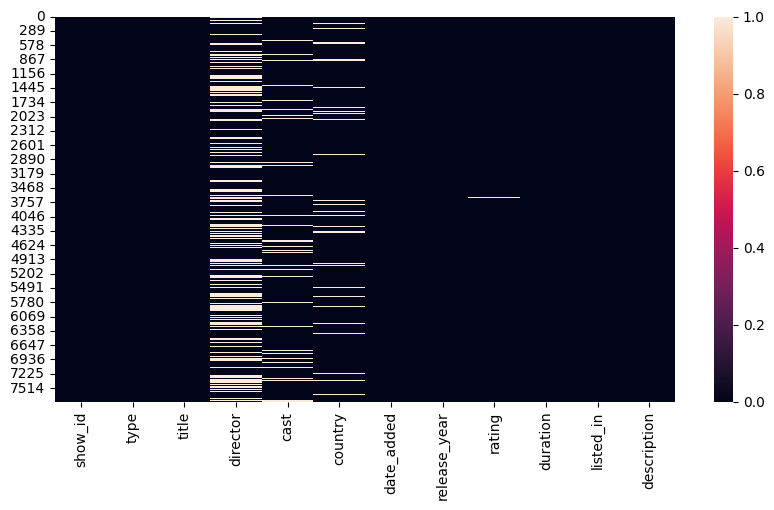

In [8]:
# Visualizing the missing values Heatmap
plt.figure(figsize=(10,5))
sns.heatmap(df_nmt.isnull(),cbar=True)

### What did you know about your dataset?

* The dataset contains a total **7787 data**.There are **7787 rows and 12 columns** in the data.The dataset has **no duplicate vaules** and dateset **five columns missing vaules** like director, cast, country, date_added and rating.
* This dataset contains a mix of categorical, numerical and texual data.
* This dataset Moive and Tv show information of a name, director,cast, country,add_date, release_year and description .
* The release_year column contains the release years Movies and Tvshows data information.the rang of year 1925 to 2021.
* The description , cast and title columns data can be used for Machine learning ,Processing or vectorization in content based analysis or clustering .


## ***2. Understanding Your Variables***

In [ ]:
# Dataset Columns
df_nmt.columns

Index(['show_id', 'type', 'title', 'director', 'cast', 'country', 'date_added',
       'release_year', 'rating', 'duration', 'listed_in', 'description'],
      dtype='object')

In [9]:
df_nmt.dtypes

,0
show_id,object
type,object
title,object
director,object
cast,object
country,object
date_added,object
release_year,int64
rating,object
duration,object


In [ ]:
# Dataset Describe
df_nmt.describe()

,release_year
count,7787.000000
mean,2013.932580
std,8.757395
min,1925.000000
25%,2013.000000
50%,2017.000000
75%,2018.000000
max,2021.000000


### Variables Description

* **show_id** : Unique identifier ID for every Movie / Tv Show
* **type** : Identifier - A Movie or TV Show
* **title** : Title of the Movie / Tv Show
* **director** : Name of the Director of the Movie or TV Show
* **cast** : Actors involved in the movie / show
* **country** : Country where the movie / show was produced
* **date_added** : Date the Movie or TV Show was added to it was added on Netflix
* **release_year** : Actual Releaseyear of the movie / show
* **rating** : TV Rating of the movie / show
* **duration** : Total Duration - in minutes or number of seasons
* **listed_in** : Genre(s) the title belongs to (like., Drama, Comedy)
* **description**: The short summary of the Movie or TV Show

### Check Unique Values for each variable.

In [10]:
# Check Unique Values for each variable.
df_nmt.nunique()

,0
show_id,7787
type,2
title,7787
director,4049
cast,6831
country,681
date_added,1565
release_year,73
rating,14
duration,216


In [ ]:
for i in df_nmt.columns.tolist():
  print("----------------------------------------------------- ")
  print("No. of unique values in ",i,"is",df_nmt[i].unique())

## 3. ***Data Wrangling***

In [11]:
# Copy Data Fram
df = df_nmt.copy()

### Data Wrangling Code

### **Handling Missing/Null Values from each column**

In [12]:
# Write your code to make your dataset analysis ready.
# Fill missing values in 'director', 'cast', and 'country' columns with "Unknown"
df['director'].fillna("Unknown", inplace=True)
df['cast'].fillna("Unknown", inplace=True)
df['country'].fillna("Unknown", inplace=True)

# Drop remaining rows with any missing values ('date_added', 'rating')
df.dropna(axis=0, inplace=True)  # Drop rows with missing values (row-wise)

**Feature Engineering**

In [13]:
# change object to datetime type format
df['date_added'] = pd.to_datetime(df['date_added'].str.strip(), format='%B %d, %Y', errors='coerce')
# Two new column add :- 'date_added' - Year and Month added Column.
# Extracting  month and year from date_added column
df['year_added'] = df['date_added'].dt.year
df['month_added'] = df['date_added'].dt.month
# Dropping date_added
df.drop('date_added', axis=1, inplace=True)


### What all manipulations have you done and insights you found?

* The dataset critical missing/null values are handled:
  * Missing values in director, cast, country were filled with **"Unknown"**.
  * Rows with missing values in critical columns like date_added, rating were dropped using dropna(axis=0).

* The date_added column was converted from object to datetime format.

* The feature engineering in **created two new columns**:
   * year_added → Extracted year when the movie/show was added to Netflix.
   * month_added → Extracted month when the movie/show was added to Netflix.

Next Step :- Data Visualization a insights and Handling Outliers data and machine learning tasks.

In [14]:
df.describe(include='all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
show_id,7770,7770,s7787,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN
type,7770,2,Movie,5372,NaN,NaN,NaN,NaN,NaN,NaN,NaN
title,7770,7770,ZZ TOP: THAT LITTLE OL' BAND FROM TEXAS,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN
director,7770,4048,Unknown,2376,NaN,NaN,NaN,NaN,NaN,NaN,NaN
cast,7770,6818,Unknown,718,NaN,NaN,NaN,NaN,NaN,NaN,NaN
country,7770,682,United States,2546,NaN,NaN,NaN,NaN,NaN,NaN,NaN
release_year,7770.0,NaN,NaN,NaN,2013.935393,8.764357,1925.0,2013.0,2017.0,2018.0,2021.0
rating,7770,14,TV-MA,2861,NaN,NaN,NaN,NaN,NaN,NaN,NaN
duration,7770,216,1 Season,1606,NaN,NaN,NaN,NaN,NaN,NaN,NaN
listed_in,7770,491,Documentaries,334,NaN,NaN,NaN,NaN,NaN,NaN,NaN


## ***4. Data Vizualization, Storytelling & Experimenting with charts : Understand the relationships between variables***

In [15]:
movies_data = df[df['type'] == 'Movie']
tvShows_data = df[df['type'] == 'TV Show']

#### Chart - 1. **Netflix Movies vs TV Shows**

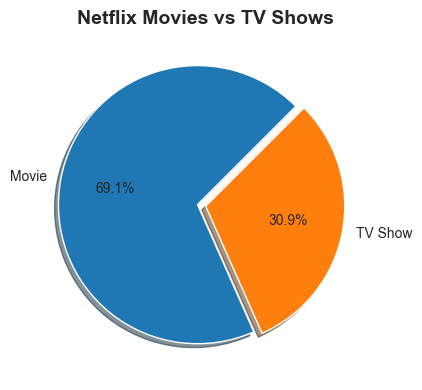

type
Movie      5372
TV Show    2398
Name: count, dtype: int64


In [ ]:
# Chart - 1 visualization code
# Plot
plt.figure(figsize=(8,4))
# Set style
sns.set_style('whitegrid')
plt.pie(df['type'].value_counts(),labels=df['type'].value_counts().index, explode=(0.06, 0),
    shadow=True, autopct='%1.1f%%',startangle=45)
plt.title('Netflix Movies vs TV Shows', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

print(f"{df['type'].value_counts()}")

##### 1. Why did you pick the specific chart?

* I picked pie chart because it is a effective way to visual represent proportions between categories.It shows the percentage share of each type, making it easy to compare their relative sizes without requiring detailed numerical analysis.

##### 2. What is/are the insight(s) found from the chart?

* This insight shows that there is a significantly larger number of movies compared to TV shows in the dataset.

  * Netflix has Movies for approximately **69.1% (5372)** of the content.

  * Netflix has TV shows for approximately **30.9% (2398)** of the content.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

* Positive business impact :-  Netflix sees is a higher demand for movies, or a trend indicating higher user engagement with movies.

 * They could focus on acquiring or producing more movies to better focus on that demand

* Negative impact : If Netflix ignores the demand for TV Shows, it could lose viewers to competitors like Disney+ and Amazon Prime, who focus more on TV series.

Netflix should balance both Movies and TV Shows to keep growing!



#### Chart - 2. **Top movies/shows producing countries**  

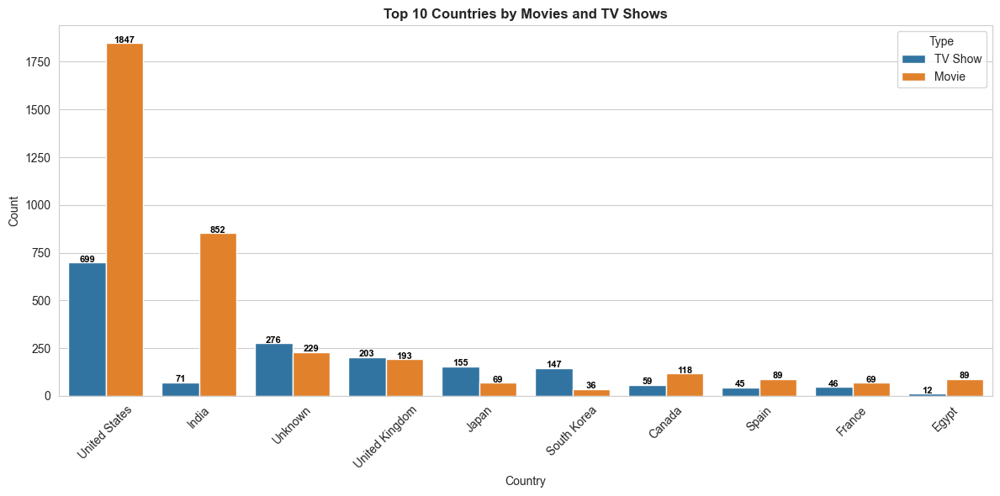

In [ ]:
#visualization code
plt.figure(figsize=(12,6))
# Set style
sns.set_style('whitegrid')

# Create the countplot
ax = sns.countplot(x="country",data=df,hue='type',order=df['country'].value_counts().head(10).index)

# Annotate each bar manually
for container in ax.containers:
    for bar in container:
        ax.text(bar.get_x() + bar.get_width() / 2, bar.get_height() + 15,f'{int(bar.get_height())}',ha='center', va='center',
            fontsize=8, fontweight='bold',color='black')

# Rotate x-axis labels
plt.xticks(rotation=45)

# Titles and labels
plt.title('Top 10 Countries by Movies and TV Shows',fontweight='bold')
plt.xlabel('Country', fontsize=10)
plt.ylabel('Count', fontsize=10)
plt.legend(title='Type')

plt.tight_layout()
plt.show()


##### 1. Why did you pick the specific chart?

I picked a countplot chart because it is an idea for value counts to compare categorical data.the visual represent the top 10 countries producing the content Movies and TV Shows for Netflix.

##### 2. What is/are the insight(s) found from the chart?

* The insight from the chart is that the United States is the largest contributor of content on Netflix, producing **1847** movies and **699** TV Shows.

* India is the second-largest contributor with **852** movies.

* Other all country medium to low contribution compared to the United States and India.


##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

* Positive business Impact : Netflix can also invest in countries medium to low contribution to grow in new markets.

* Negative Growth Impact:- India in lower TVShows data and other countries average Movie and TvShows data contribution.

Netflix can focus more on these countries to grow their business faster.

#### Chart - 3. **Rating content by Movies and TV Shows**

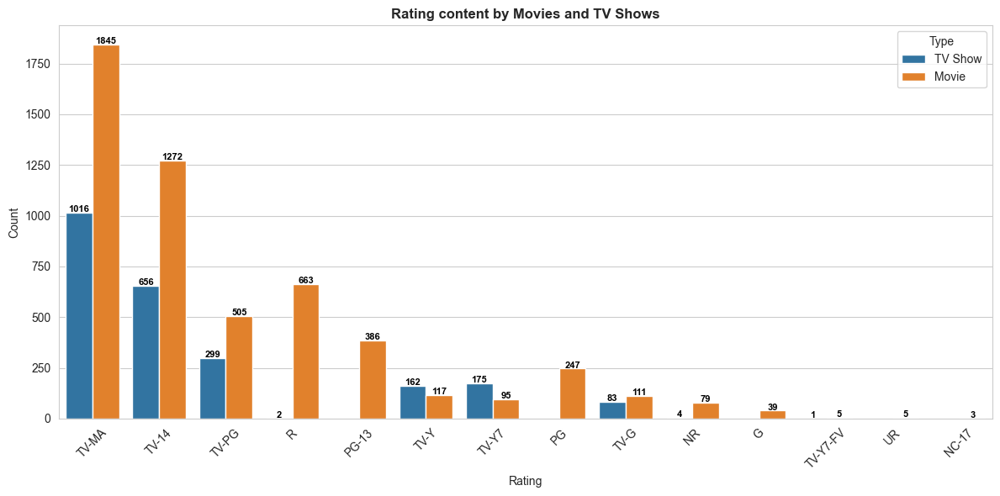

In [ ]:
# Chart - 3
#visualization code
plt.figure(figsize=(12,6))
# Set style
sns.set_style('whitegrid')

# Create the countplot
ax = sns.countplot(x="rating",data=df,hue='type',order=df['rating'].value_counts().index)

# Annotate each bar manually
for container in ax.containers:
    for bar in container:
        ax.text(bar.get_x() + bar.get_width() / 2, bar.get_height() + 15,f'{int(bar.get_height())}',ha='center', va='center',
            fontsize=8, fontweight='bold',color='black')

# Rotate x-axis labels
plt.xticks(rotation=45)

# Titles and labels
plt.title('Rating content by Movies and TV Shows',fontweight='bold')
plt.xlabel('Rating', fontsize=10)
plt.ylabel('Count', fontsize=10)
plt.legend(title='Type')

plt.tight_layout()
plt.show()

In [ ]:
data = movies_data.groupby(['country','rating', 'type']).size().sort_values(ascending=False).reset_index(name='count')

In [ ]:
df.rating.value_counts().to_frame().T

rating,TV-MA,TV-14,TV-PG,R,PG-13,TV-Y,TV-Y7,PG,TV-G,NR,G,TV-Y7-FV,UR,NC-17
count,2861,1928,804,665,386,279,270,247,194,83,39,6,5,3


**Maturity Ratings** combine movie and TV ratings into levels, with recommended audience age groups.:-

*https://www.primevideo.com/help?nodeId=GFGQU3WYEG6FSJFJ*

* **Kids (All Ages)**: ["TV-Y", "TV-G", "G", "PG"]
* **Older Kids (7+14)**: ["TV-Y7", "TV-Y7-FV", "PG"]
* **Teens (13+19)**: ["TV-PG", "PG-13", "TV-14"]
* **Young Adults (16+24)**: ["TV-14", "R"]
* **Adults (18+)**: ["TV-MA", "NC-17", "UR", "NR"]

##### 1. Why did you pick the specific chart?

I picked a countplot chart because it is an idea for value counts to compare categorical data.the visual represent how Netflix Movies and TV Shows are distributed across different ratings.

##### 2. What is/are the insight(s) found from the chart?

* TV-MA and TV-14 are the high dominant ratings.This indicates that mature and teen-oriented content is the most common across Netflix Movies and TV Shows.

* TV-PG/R/PG-13/TV-Y/TV-Y7/PG/TV-G are the midium dominant rating.This indicates that suggests Netflix also hosts a fair amount of family-friendly and general audience content, but not as heavily as mature-rated content.

* NR/G/TV-Y7-FV/UR/NC-17 is the very low dominant rating.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

* Postive Impact:- Netflix has a strong content presence for younger audiences, especially teens and young adults.

  * This supports high engagement from viewers aged 13 to 18+, who are likely drawn to mature and teen-focused shows and movies.

* Negative Impact:- Kids content (ages 0–12) is fewer shows/movies.

  * This imbalance presents a potential risk, as families with children may turn to competitors like Disney+ or Amazon Prime Video, which offer more extensive kids' programming.

* This content imbalance could contribute to negative growth in Netflix's family-oriented market segment.

#### Chart - 4. **Top Directors Movies/TVShows**

In [85]:
# No showing unknown data
df_director_movie = movies_data[movies_data['director']!='Unknown']
df_director_tvShow= tvShows_data[tvShows_data['director']!='Unknown']

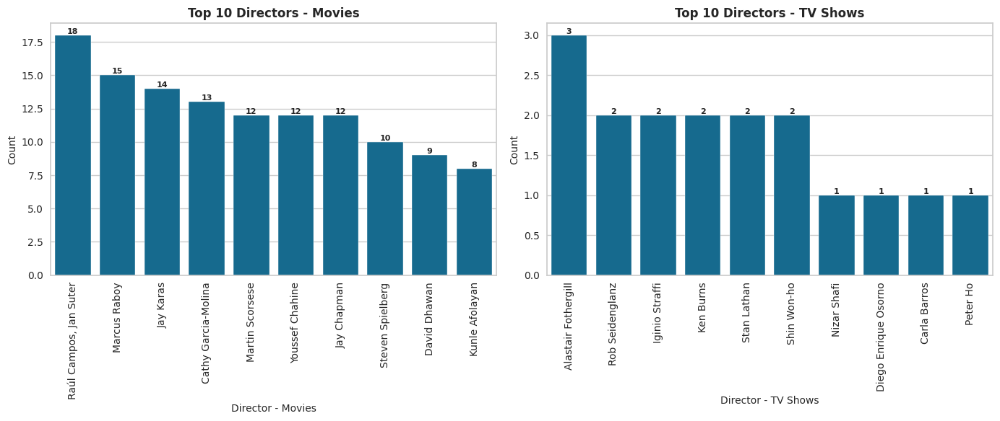

In [89]:
# Chart - 4 visualization code
fig, ax = plt.subplots(1, 2, figsize=(14, 6))
sns.set_style('whitegrid')

# Define datasets and titles
datasets = [df_director_movie, df_director_tvShow]
titles = ['Top 10 Directors - Movies', 'Top 10 Directors - TV Shows']
xlabels = ['Director - Movies', 'Director - TV Shows']

# Loop subplots
for i in range(2):
    top_directors = datasets[i]['director'].value_counts().head(10).index
    sns.countplot(x="director", data=datasets[i], order=top_directors, ax=ax[i])

    ax[i].set_title(titles[i], fontweight='bold')
    ax[i].set_xlabel(xlabels[i], fontsize=10)
    ax[i].set_ylabel('Count', fontsize=10)
    ax[i].tick_params(axis='x', rotation=90)

    # Annotate bars
    for bar in ax[i].containers[0]:
        height = bar.get_height()
        ax[i].text(bar.get_x() + bar.get_width() / 2, height , f'{int(height)}',
                   ha='center', va='bottom', fontsize=8, fontweight='bold')

plt.tight_layout()
plt.show()


##### 1. Why did you pick the specific chart?

I picked Countpolt chart ,because it is an idea for value counts of categorical data.the number of Movies and TV Shows directed by the top directors.

##### 2. What is/are the insight(s) found from the chart?

* Top directors like Raúl Campos, Marcus Raboy, and Jay Karas appear frequently in the movie category.

* In TV shows, a few names stand out but with less frequency than movies, suggesting a broader distribution of creators.

* This indicates higher concentration of direction roles in movies compared to TV shows.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

Positive Impact: There is a clear dominance of certain directors in Netflix’s content, with some directors appearing frequently in either Movies or TV Shows.

Negative Impact: Over-reliance on a small group of directors might reduce content diversity and innovation over time.



#### Chart - 5. **Top Cast Movies/TVShows**

In [17]:
# No showing unknown data
df_cast_movie = movies_data[movies_data['cast']!='Unknown']
df_cast_tvShow= tvShows_data[tvShows_data['cast']!='Unknown']

In [24]:
df['cast'].head(3)

,cast
0,"João Miguel, Bianca Comparato, Michel Gomes, R..."
1,"Demián Bichir, Héctor Bonilla, Oscar Serrano, ..."
2,"Tedd Chan, Stella Chung, Henley Hii, Lawrence ..."


In [18]:
##contains a single string per row
df_cast_movie= df_cast_movie['cast'].str.split(', ', expand=True).stack()
df_cast_tvShow= df_cast_tvShow['cast'].str.split(', ', expand=True).stack()

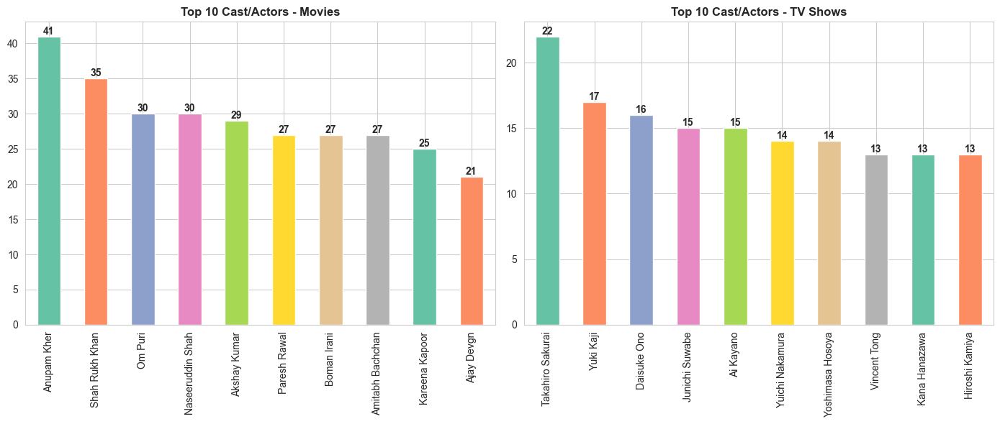

In [ ]:
# Chart - 5 visualization code
fig, ax = plt.subplots(1, 2, figsize=(14, 6))
sns.set_style('whitegrid')

# Use Seaborn color palettes
palette = sns.color_palette("Set2")  # You can also try "Set2", "muted", etc.

# Plot for Movies
ax[0]=df_cast_movie.value_counts().head(10).plot(kind='bar',ax=ax[0], color=palette[:10])
for bar in ax[0].containers[0]:
    height = bar.get_height()
    ax[0].text(bar.get_x() + bar.get_width() / 2, height , f'{int(height)}',
               ha='center', va='bottom', fontsize=10, fontweight='bold')
ax[0].set_title('Top 10 Cast/Actors - Movies', fontweight='bold')

# Plot for TV Shows
ax[1]=df_cast_tvShow.value_counts().head(10).plot(kind='bar',ax=ax[1], color=palette[:10])
for bar in ax[1].containers[0]:
    height = bar.get_height()
    ax[1].text(bar.get_x() + bar.get_width() / 2, height , f'{int(height)}',
               ha='center', va='bottom', fontsize=10, fontweight='bold')
ax[1].set_title('Top 10 Cast/Actors - TV Shows', fontweight='bold')

# Adjust layout and display the chart
plt.tight_layout()
plt.show()

##### 1. Why did you pick the specific chart?

I am picked a bar chart because it visual which actors appeared the most in movies and TV shows. It's great for comparing counts and works well when we want to highlight the top actors in each category.

##### 2. What is/are the insight(s) found from the chart?

Movies:

* Anupam Kher leads with 41 appearances, followed by Shah Rukh Khan (35) and Om Puri / Naseeruddin Shah (30).

* The list includes many veteran and versatile Bollywood actors, indicating their strong association with Netflix's Indian movie content.

* The distribution shows a relatively even spread among the top actors, with all top 10 actors appearing in over 20 films.

TV Shows:

* Takahiro Sakurai tops with 22 appearances, followed by Yuki Kaji (17) and Daisuke Ono (16).

* The cast is dominated by Japanese voice actors, indicating a strong presence of anime content on Netflix.

* High counts reflect ongoing or multiple-season anime series using the same cast.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

Positive Impact : Netflix can focus on popular actors to promote content more effectively.

* If certain actors attract more viewers, Netflix can feature them more in new content to increase engagement.

* It also helps identify regional preferences, like Bollywood actors for Indian audiences or anime voice actors for anime fans.

* The strong presence of Japanese voice actors reflects a growing anime audience, suggesting that Netflix should continue or expand anime content.

* The dominance of Bollywood actors in movies and anime voice actors in TV shows aligns with regional content trends, helping Netflix grow in India and East Asia.

Negative Impact : Netflix relies too much on the same few actors, viewers might feel content is repetitive.

* Netflix could invest in promoting emerging talent or content diversity across more countries.

#### Chart - 6. **Top netflix genre**

In [90]:
# number of genres present in dataset
# contains a single string per row
genre_count = df['listed_in'].str.split(', ', expand=True).stack()
# top 10 genres in listed movies/TV shows
genre_count = genre_count.value_counts()
print(genre_count.head(10))

International Movies        2437
Dramas                      2105
Comedies                    1471
International TV Shows      1197
Documentaries                786
Action & Adventure           721
TV Dramas                    703
Independent Movies           673
Children & Family Movies     532
Romantic Movies              531
Name: count, dtype: int64


In [ ]:
##contains a single string per row
genre_movies_df = movies_data['listed_in'].str.split(', ', expand=True).stack()
genre_tvShows_df = tvShows_data['listed_in'].str.split(', ', expand=True).stack()

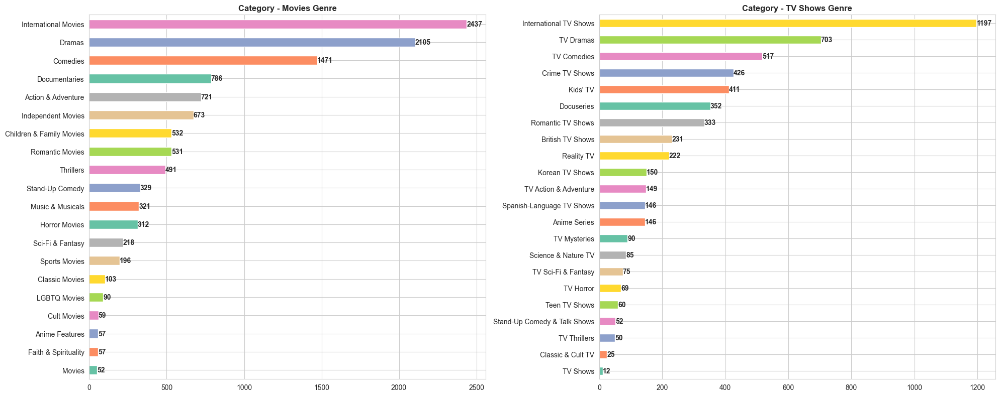

In [ ]:
# Chart - 6 visualization code
fig, ax = plt.subplots(1, 2, figsize=(20, 8))
sns.set_style('whitegrid')
# Use Seaborn color palettes
palette = sns.color_palette("Set2")
# Category - Movies Genre
ax[0]=genre_movies_df.value_counts().sort_values(ascending=True).plot(kind='barh',ax=ax[0], color=palette[:10])
for bar in ax[0].containers[0]:
    height = bar.get_height()
    ax[0].text(bar.get_width(), bar.get_y() + bar.get_height() / 2, f'{int(bar.get_width())}',
               ha='left', va='center', fontsize=10, fontweight='bold')

ax[0].set_title('Category - Movies Genre', fontweight='bold')
# Category - TV Shows Genre
ax[1]=genre_tvShows_df.value_counts().sort_values(ascending=True).plot(kind='barh',ax=ax[1], color=palette[:10])
for bar in ax[1].containers[0]:
    height = bar.get_height()
    ax[1].text(bar.get_width(), bar.get_y() + bar.get_height() / 2, f'{int(bar.get_width())}',
               ha='left', va='center', fontsize=10, fontweight='bold')

ax[1].set_title('Category - TV Shows Genre', fontweight='bold')

# Adjust layout and display the chart
plt.tight_layout()
plt.show()

##### 1. Why did you pick the specific chart?

I picked a horizontal bar chart because it effectively visual a large number of categories and allows easy comparison of genre popularity across Movies and TV Shows.

##### 2. What is/are the insight(s) found from the chart?

Movies:

* The most popular category is International Movies, followed by Dramas and Comedies.

* Niche categories like LGBTQ Movies, Cult Movies, and Faith & Spirituality have much less content.

TV Shows:

* International TV Shows and TV Dramas lead the chart.

* Genre diversity includes regional content (like Korean TV Shows, British TV Shows, Spanish-Language TV) and niche genres like Teen TV Shows and TV Horror.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

* The high volume of International content and dramas indicates strong global engagement. Netflix can double down on international and drama genres to attract more viewers worldwide.

* The presence of Korean, Spanish, and British TV genres shows regional genre preferences, helping Netflix tailor content for specific markets.

* Netflix can expand Comedy and Romantic genres, which are consistently popular across both categories.

#### Chart - 7. **Distribution count of Releases by Year (Movies vs TV Shows)**

In [ ]:
df_release_year = df.groupby(['release_year']).agg({'show_id':'count'}).reset_index()\
.rename(columns={'show_id':'count'}).sort_values(by='release_year', ascending=False).head(15)

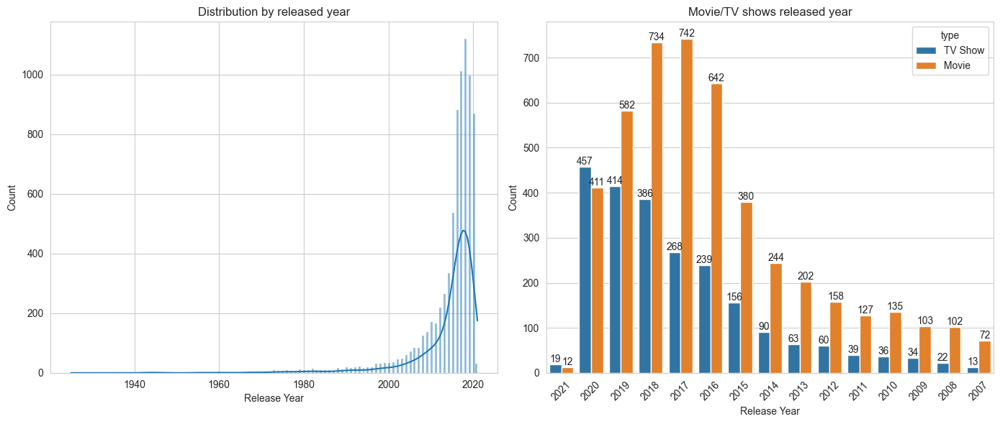

In [ ]:
# Chart - 7 visualization code
fig,ax = plt.subplots(1,2, figsize=(14,6))
# Plot 1: Histogram of release years with KDE
a=sns.histplot(df['release_year'],ax=ax[0],kde=True)
a.set_title('Distribution by released year', size=12)
ax[0].set_xlabel('Release Year')
ax[0].set_ylabel('Count')

# Plot 2: Count of Movies vs TV Shows by Release Year (Top 15 years)
ax[1] = sns.countplot(x='release_year', data=df, order=df_release_year['release_year'].value_counts().index[:15],hue='type')

# Add value labels on top of bars
for container in ax[1].containers:
    ax[1].bar_label(container)

ax[1].set_title('Movie/TV shows released year', size=12)
ax[1].set_xlabel('Release Year')
ax[1].set_ylabel('Count')
plt.xticks(rotation=45)
# Adjust layout and display the chart
plt.tight_layout()
plt.show()

##### 1. Why did you pick the specific chart?

The first chart, a histogram with KDE (Kernel Density Estimate), is ideal for showing the distribution of content over the years. It helps understand trends in content release frequency, highlighting periods of growth or decline.

The second chart, a countplot with hue by type (Movie/TV Show), effectively visualizes the volume of content released per year, with a breakdown between movies and TV shows. It helps compare how different types of content contributed to the overall volume in recent years.

##### 2. What is/are the insight(s) found from the chart?

* The **first chart** (histplot) shows that content releases significantly increased after **2015**, peaking around **2018–2020**, indicating Netflix’s **growing investment in original content**.

* The **second** chart (countplot) reveals that in recent years, there is a higher frequency of TV Shows being released **compared to Movies, especially around 2018–2020**.

* The number of TV Shows and Movies released is almost balanced, but earlier years were more movie-focused.

* The data also suggests that 2020 had one of the highest content releases, likely due to global demand for streaming content during the pandemic.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

Positive Impact:

* The increasing trend of releases shows Netflix’s growing content library, which is a key competitive advantage to attract and retain subscribers.

* Recognizing that TV Shows are gaining popularity, Netflix can further invest in serialized content, which tends to increase user watch time and retention.

* Understanding peak years helps in resource planning, forecasting content acquisition/production needs, and optimizing marketing strategies around release cycles.

Negative Impact:

* The release volume keeps increasing without maintaining content quality, it might lead to viewer fatigue or drop in satisfaction.

#### Chart - 8 - **Duration Distribution of Movie - min  /  TV Show - seasons**

In [ ]:
movies_data['duration'] = movies_data['duration'].str.replace(' min', '').astype(int)
tvShows_data['duration'] = tvShows_data['duration'].str.replace(' Seasons', '').str.replace(' Season', '').astype(int)

In [ ]:
mvd_df= movies_data['duration'].describe()
tvs_df= tvShows_data['duration'].describe()
pd.DataFrame([mvd_df,tvs_df],index=['Movies','TV Shows'])

,count,mean,std,min,25%,50%,75%,max
Movies,5372.0,99.330417,28.524206,3.0,86.0,98.0,114.0,312.0
TV Shows,2398.0,1.761468,1.561099,1.0,1.0,1.0,2.0,16.0


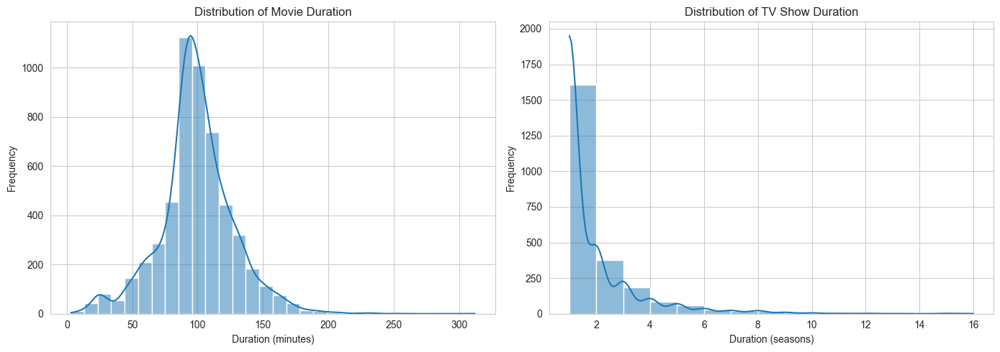

In [ ]:
# Chart - 8 visualization code
fig,ax = plt.subplots(1,2, figsize=(14,5))

# Histogram of Movie durations (in minutes)
ax[0]=sns.histplot(movies_data['duration'],kde=True,bins=30,ax=ax[0])
ax[0].set_title('Distribution of Movie Duration')
ax[0].set_xlabel('Duration (minutes)')
ax[0].set_ylabel('Frequency')
# Histogram of TV Show durations (in seasons)
ax[1]= sns.histplot(tvShows_data['duration'],kde=True,bins=15,ax=ax[1])
ax[1].set_title('Distribution of TV Show Duration')
ax[1].set_xlabel('Duration (seasons)')
ax[1].set_ylabel('Frequency')
plt.tight_layout()
plt.show()

##### 1. Why did you pick the specific chart?

I picked histograms with KDE (Kernel Density Estimate) because they effectively show the distribution and spread of duration data for both movies and TV shows.

* Movies this helps visualize how long typical content lasts (in minutes).

* TV shows, since duration is measured in number of seasons, it gives insight into how much content viewers can expect per title.

##### 2. What is/are the insight(s) found from the chart?

Movies:

* Most movies have a duration between 80 and 120 minutes, with a peak around 90 minutes.

* The distribution is right-skewed, indicating a few movies are significantly longer (possibly over 150 minutes), but the majority fall within a typical range.

TV Shows:

* Most shows last 1 to 2 seasons, with 1 season being the most common.

* The distribution is heavily left-skewed, suggesting that limited series or mini-series are dominant, while only a small number extend beyond 3 seasons.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

Positive Impact:

* Netflix plan content that matches viewer attention spans and preferences (e.g., short series, movies around 90 mins).

* Useful for content acquisition and production teams to maintain durations that are most engaging to users.

Potential Insight:

* If too many shows are short-lived (1 season), it might signal lack of long-term viewer investment or early cancellations, which can affect brand loyalty.

* Netflix should monitor completion rates and audience demand before limiting show durations.

#### Chart - 9. **Netflix content added each year for Movies and TV Shows.**

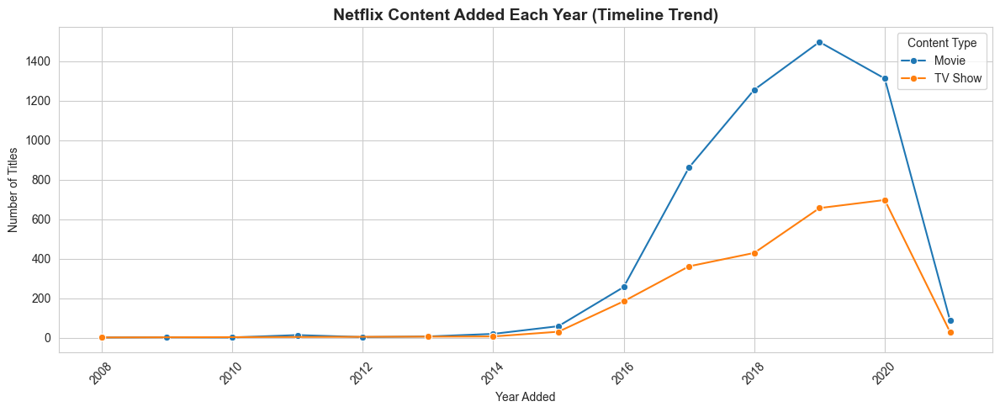

In [ ]:
# Chart - 9 visualization code
# Group by year and type
yearly_trend = df.groupby(['year_added', 'type']).size().reset_index(name='count')

# Plotting
plt.figure(figsize=(12, 5))
sns.set_style("whitegrid")
ax[0]= sns.lineplot(data=yearly_trend, x='year_added', y='count', hue='type', marker='o')
plt.title('Netflix Content Added Each Year (Timeline Trend)', fontsize=14, fontweight='bold')
plt.xlabel('Year Added')
plt.ylabel('Number of Titles')
plt.xticks(rotation=45)
plt.legend(title='Content Type')
plt.tight_layout()
plt.show()

##### 1. Why did you pick the specific chart?

I picked a line plot because it clearly shows the trend of content added over time. It’s ideal for visualizing how the number of Movies and TV Shows has changed year by year. The use of markers and color-coded lines helps easily distinguish between content types.



##### 2. What is/are the insight(s) found from the chart?

* Netflix started adding significant volumes of content around 2015, with a major increase from 2016 to 2020.

* Movies consistently outnumber TV Shows every year, with a peak in 2019 at nearly 1500 titles.

* Both Movies and TV Shows grew steadily, but Movies consistently outnumber TV Shows.



##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

Positive Business Impact:

* Netflix identify high-growth years and plan future content investments more strategically.

* Confirms that movie content is a key growth driver, which can guide resource allocation.

* Trends can assist in understanding viewer demand cycles and adjusting release strategies accordingly.

Negative Insight:
* The significant drop in 2021 indicates potential production or licensing challenges.

The identifying years with high user engagement or subscriber increases, Netflix can correlate that to high content release years and plan future investments accordingly.

#### Chart - 10. **Netflix Content Added by Month**

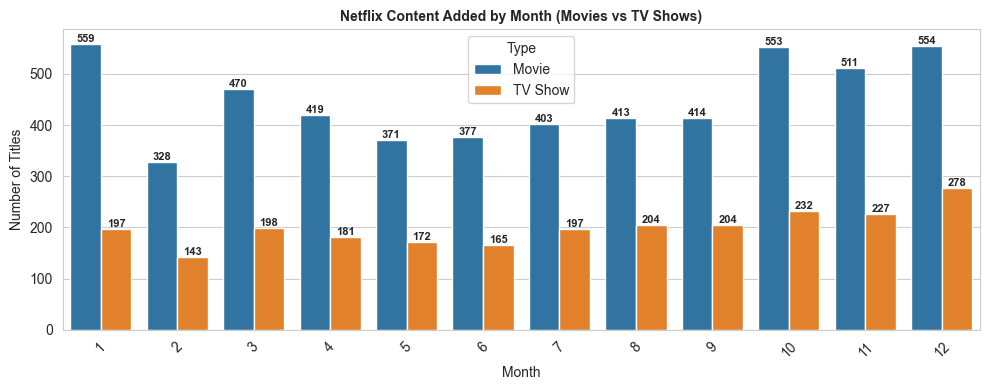

In [ ]:
# Chart - 10 visualization code
plt.figure(figsize=(10,4))
sns.set_style("whitegrid")
ax = sns.countplot(data=df, x='month_added', hue='type')
for bars in ax.containers: # Use ax directly
    for bar in bars.patches:  # Iterate through patches in each container
        height = bar.get_height() # Now get_height() will work
        ax.text(bar.get_x() + bar.get_width() / 2, height , f'{int(height)}',
                   ha='center', va='bottom', fontsize=8, fontweight='bold')

plt.title('Netflix Content Added by Month (Movies vs TV Shows)', fontsize=10, fontweight='bold')
plt.xlabel('Month')
plt.ylabel('Number of Titles')
plt.xticks(rotation=45)
plt.legend(title='Type')
plt.tight_layout()
plt.show()

##### 1. Why did you pick the specific chart?

I picked a countplot (bar chart) with a hue for content type because it effectively compares the number of Movies and TV Shows added to Netflix month by month.

This chart makes it easy to compare monthly trends and seasonal content release patterns.

##### 2. What is/are the insight(s) found from the chart?

* July and October are the peak months for content addition, especially for Movies.

* TV Shows are added more consistently throughout the year, but at a slightly lower frequency than Movies.

* There is a noticeable dip in February and April, indicating slower content release during these months.

* Netflix appears to follow a content release strategy aligned with audience engagement periods (holidays, fall season).

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

Positive Impact:
* Marketing and release planning can be optimized around high-performing months like July and October, when user engagement might be higher.

* Identifying low-content months like February can help in filling content gaps and keeping users consistently engaged year-round.

* On the other hand, lower activity in months like February or September might suggest an opportunity to fill content gaps, avoiding user drop-offs during those months.

Negative Impact:

* The low volume in certain months may indicate missed opportunities for engagement, especially if competition is active during those periods.

#### Chart - 11. **The most occurred word in the title of the movies and TV shows**

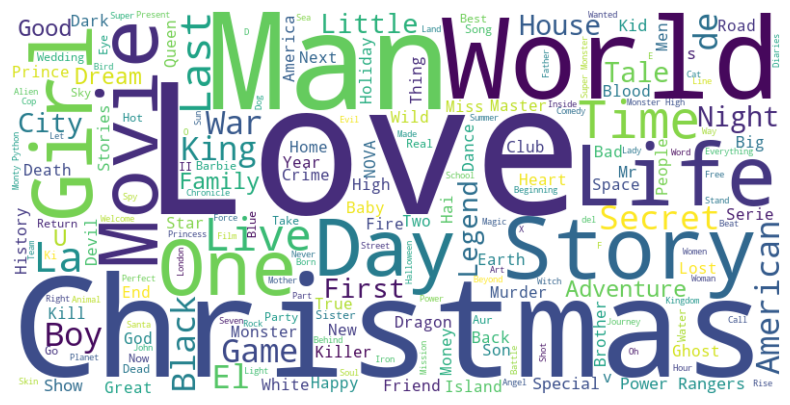

In [ ]:
# Chart - 11 visualization code

#text documents
text = " ".join(word for word in df['title'])
wordcloud = WordCloud(width=800, height=400, background_color='white').generate(text)
# Plot the WordCloud
plt.figure(figsize=(14, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

##### 1. Why did you pick the specific chart?

I picked Word Cloud chart is visualization the frequency of words in textual data like titles. It provides an intuitive, engaging, and visually appealing way to identify the most common keywords in the dataset. Larger words indicate higher frequency, making it easier to spot popular patterns in content naming.



##### 2. What is/are the insight(s) found from the chart?

* Common words like "Love", "Life", "Story", "Girl", "Man", etc., stand out—indicating recurring themes in the content.

* It reveals a bias toward emotional, dramatic, or character-driven stories.

* There might be repetitive naming conventions, possibly aiming at emotional relatability or targeting younger demographics.


##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

Which words are most common in product titles, marketers can align future campaigns with high-engagement keywords or optimize SEO strategies.



#### Chart - 12. **The most occurred word in the description.**

In [ ]:
df['description'].unique()

array(['In a future where the elite inhabit an island paradise far from the crowded slums, you get one chance to join the 3% saved from squalor.',
       'After a devastating earthquake hits Mexico City, trapped survivors from all walks of life wait to be rescued while trying desperately to stay alive.',
       "When an army recruit is found dead, his fellow soldiers are forced to confront a terrifying secret that's haunting their jungle island training camp.",
       ...,
       "In this documentary, South African rapper Nasty C hits the stage and streets of Tokyo, introducing himself to the city's sights, sounds and culture.",
       'Dessert wizard Adriano Zumbo looks for the next “Willy Wonka” in this tense competition that finds skilled amateurs competing for a $100,000 prize.',
       'This documentary delves into the mystique behind the blues-rock trio and explores how the enigmatic band created their iconic look and sound.'],
      dtype=object)

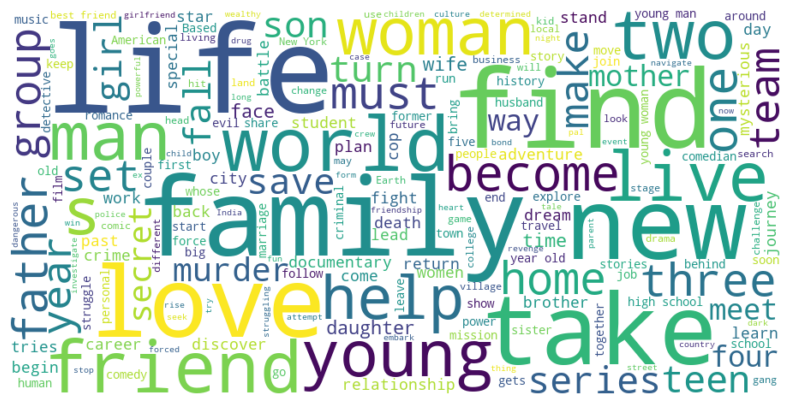

In [ ]:
# Chart - 12 visualization code
#text documents
text = " ".join(word for word in df['description'])
wordcloud = WordCloud(width=900, height=450, background_color='white').generate(text)
# Plot the WordCloud
plt.figure(figsize=(18, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

##### 1. Why did you pick the specific chart?

The Word Cloud chart is ideal for summarizing and visualizing large amounts of textual data. It helps highlight the most frequently used terms in the description field, offering a quick overview of the key themes, features, or selling points emphasized in product or service descriptions.

##### 2. What is/are the insight(s) found from the chart?

* Prominent words such as "life", "family", "friends", "love", "world", and "young" suggest a strong focus on personal relationships, drama, and coming-of-age stories.

* Frequent use of action- and emotion-based words indicates that the platform emphasizes engaging and emotionally resonant storytelling.

* Terms like "man", "woman", "story", and "adventure" reflect common narrative formats.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

* Benifit high-frequency keywords to improve searchability and personalized content suggestions.



#### Chart - 13

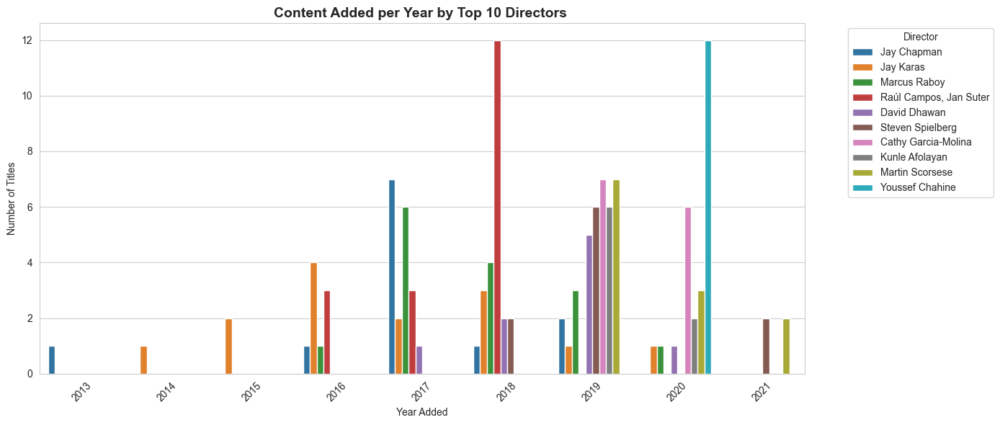

In [ ]:
# Chart - 13 visualization code
# Filter out 'Unknown' directors
df_directors = movies_data[movies_data['director'] != 'Unknown']

# Get top 10 directors by number of titles
top_directors = df_directors['director'].value_counts().head(10).index

# Filter data to include only top directors
filtered = df_directors[df_directors['director'].isin(top_directors)]

# Group by year and director
grouped = filtered.groupby(['year_added', 'director']).size().reset_index(name='count')

# Plot
plt.figure(figsize=(14,6))
sns.barplot(data=grouped, x='year_added', y='count', hue='director', palette='tab10')
plt.title('Content Added per Year by Top 10 Directors ', fontsize=14, fontweight='bold')
plt.xlabel('Year Added')
plt.ylabel('Number of Titles')
plt.xticks(rotation=45)
plt.legend(title='Director', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()


##### 1. Why did you pick the specific chart?

I picked Barplot chart this visualization because it is an idea for value counts comparisons between multiple categories (directors) across a time series (year added). This chart provides a visual overview of how content produced by the top 10 directors has evolved over time, which can help identify trends, popular directors, and content distribution.

##### 2. What is/are the insight(s) found from the chart?

* Which directors have consistently added the most content over the years.

* Any shifts or increases in content produced by certain directors during specific years.

* Possible correlation between directors and specific periods (more content from certain directors in certain years).

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

Positive Impact :
* The overall trend of content added per director over the years, we can spot whether the number of titles per director has been consistent, growing, or declining over time. This can give insights into Netflix's relationship with popular directors.

*  Understanding which directors are most active and successful can inform decisions on partnerships or content acquisitions. If certain directors consistently add popular titles, the platform may choose to prioritize or invest in content from them.

#### Chart - 14 - Correlation Heatmap

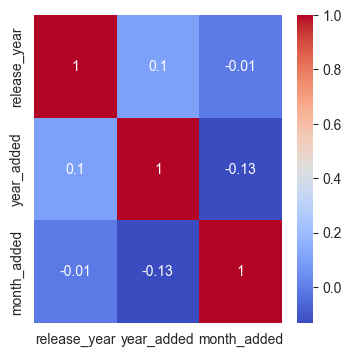

In [ ]:
# Correlation Heatmap visualization code
plt.figure(figsize=(4,4))
numeric_columns = ['release_year','year_added','month_added']
sns.heatmap(df[numeric_columns].corr(), annot=True, cmap='coolwarm')
plt.show()

##### 1. Why did you pick the specific chart?

I Picked the Correlation Heatmap because it effectively visualizes the relationships between numeric variables in the dataset. The color gradient (from cool to warm) provides an intuitive way to interpret the strength and direction of correlations, while the annotations help clarify the exact correlation values.

##### 2. What is/are the insight(s) found from the chart?

Answer Here

#### Chart - 15 - Pair Plot

<Figure size 1500x1000 with 0 Axes>

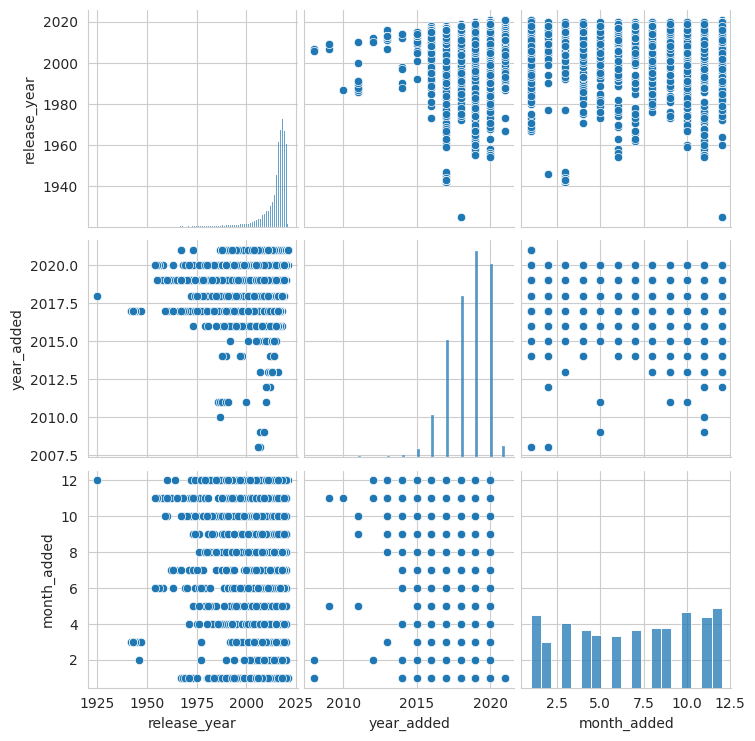

<Figure size 640x480 with 0 Axes>

In [ ]:
# Pair Plot visualization code
plt.figure(figsize=(15,10))
sns.pairplot(df)
plt.show()
plt.tight_layout()

##### 1. Why did you pick the specific chart?

I Picked the Pair Plot because it provides a comprehensive overview of the relationships between multiple numerical variables in the dataset. The pair plot visualizes pairwise scatter plots between each combination of variables, as well as histograms or density plots along the diagonal. This chart helps identify patterns, correlations, and distributions across different variables in the dataset, making it particularly useful when exploring complex relationships between features.

##### 2. What is/are the insight(s) found from the chart?

Answer Here

## ***5. Hypothesis Testing***

### Based on your chart experiments, define three hypothetical statements from the dataset. In the next three questions, perform hypothesis testing to obtain final conclusion about the statements through your code and statistical testing.

1) Statement :
* Null Hypothesis (H₀): There is no significant difference in the average number of titles added to the platform per year between directors.

* Alternate Hypothesis (H₁): There is a significant difference in the average number of titles added to the platform per year between directors.

2) Statement :

* Null hypothesis (H₀): The average number of movies on Netflix in the United States is equal to the average number of movies on Netflix in India.

* Alternate hypothesis (H₁): The average number of movies on Netflix in the United States is greater than the average number of movies on Netflix in India.


3) Statement :
* Null Hypothesis (H₀): There is no difference in the duration of movies and TV shows (in terms of duration or number of seasons).

* Alternate Hypothesis (H₁): There is a significant difference in the duration of movies and TV shows (in terms of duration or number of seasons).


### Hypothetical Statement - 1

#### 1. State Your research hypothesis as a null hypothesis and alternate hypothesis.

* Null Hypothesis (H₀): There is no significant difference in the average number of titles added to the platform per year between directors.

* Alternate Hypothesis (H₁): There is a significant difference in the average number of titles added to the platform per year between directors.

#### 2. Perform an appropriate statistical test.

In [ ]:
# Perform Statistical Test to obtain P-Value
# Grouping data by directors and calculating the average count of titles per year
grouped_directors = df.groupby(['director', 'year_added']).size().reset_index(name='count')
print(grouped_directors)
directors_grouped = grouped_directors.groupby('director')['count'].apply(list)
print("Titles added per year by director:")
directors_grouped

                 director  year_added  count
0             A. L. Vijay        2018      1
1             A. L. Vijay        2019      1
2            A. Raajdheep        2020      1
3               A. Salaam        2017      1
4         A.R. Murugadoss        2018      1
...                   ...         ...    ...
4667  Óskar Thór Axelsson        2018      1
4668     Ömer Faruk Sorak        2017      1
4669     Ömer Faruk Sorak        2018      1
4670         Şenol Sönmez        2017      1
4671         Şenol Sönmez        2019      1

[4672 rows x 3 columns]
Titles added per year by director:


,count
director,
A. L. Vijay,"[1, 1]"
A. Raajdheep,[1]
A. Salaam,[1]
A.R. Murugadoss,"[1, 1]"
Aadish Keluskar,[1]
...,...
Çagan Irmak,[1]
Ísold Uggadóttir,[1]
Óskar Thór Axelsson,[1]


In [ ]:
# Perform one-way ANOVA
f_statistic, p_value = f_oneway(*directors_grouped )
print("F-statistic:", f_statistic)

if p_value < 0.05:
    print(f"p-values {p_value} is less then 0.5")
    print("Result: Reject the null hypothesis.There is a significant difference in average number of titles added to the palform per year between directors.")
else:
    print(f"p-values {p_value} is greater then 0.5")
    print(f"Result: Fail to reject the null hypothesis.:\nNo significant difference in the average number of titles added to the platform per year between directors.")

F-statistic: 0.12974139522724928
p-values 0.9999999999999999 is greater then 0.5
Result: Fail to reject the null hypothesis.:
No significant difference in the average number of titles added to the platform per year between directors.


##### Which statistical test have you done to obtain P-Value?

* I used a **One-Way ANOVA**(Analysis of Variance) test for proportions to obtain the p-value.
* The ANOVA test to compare the means of the number of titles added per year across different directors.

##### Why did you choose the specific statistical test?

I am **choose to One-Way ANOVA (Analysis of Variance):**
* We are comparing the more than two groups (different directors).

* The independent variable is categorical (director names).

* The dependent variable is continuous (average number of titles added per year).

* ANOVA tests whether there are statistically significant differences between the group means.

### Hypothetical Statement - 2

#### 1. State Your research hypothesis as a null hypothesis and alternate hypothesis.

 Average number of movies on Netflix in United States is greater than the average number of movies on Netflix in India.

* Null hypothesis (H₀): The average number of movies on Netflix in the United States is equal to the average number of movies on Netflix in India.
  * **H₀US == H₀INDIA**

* Alternate hypothesis (H₁): The average number of movies on Netflix in the United States is greater than the average number of movies on Netflix in India.

    * **H₁US > H₁INDIA**

#### 2. Perform an appropriate statistical test.

In [ ]:
# Perform Statistical Test to obtain P-Value
#  Filter US and India movies
movies_us = df[(df['type'] == 'Movie') & (df['country'].str.contains('United States', na=False))]
movies_india = df[(df['type'] == 'Movie') & (df['country'].str.contains('India', na=False))]

# Perform Welch's t-test (one-tailed)
t_stat, p_val_two_tailed = ttest_ind( movies_us['release_year'], movies_india['release_year'], equal_var=False)

# Convert to one-tailed P-value
p_val_one_tailed = p_val_two_tailed / 2

print(f"T-statistic: {t_stat:.3f}")
print(f"One-tailed P-value: {p_val_one_tailed:.3f}")

if (t_stat > 0) and (p_val_one_tailed < 0.05):
    print(f"p-value ({p_val_one_tailed}) is less than 0.05")
    print("Reject the null hypothesis: US has significantly more movies than India.")
else:
    print(f"p-value ({p_val_one_tailed}) is greater than 0.05")
    print("Fail to reject the null hypothesis.")

T-statistic: 2.654
One-tailed P-value: 0.004
p-value (0.0040169542352063645) is less than 0.05
Reject the null hypothesis: US has significantly more movies than India.


##### Which statistical test have you done to obtain P-Value?

**Welch’s t-test** (a **one-tailed independent** samples t-test) was used to obtain the p-value.

##### Why did you choose the specific statistical test?

Welch’s t-test is ideal when comparing the of two independent groups.
      
* The release years of movies available in the United States.
* The release years of movies available in India.

The goal is to test whether the average release year (recency of movie content) differs significantly between the two countries specifically if the U.S. has newer content than India.

Welch’s version of the t-test is more appropriate than Student’s t-test because:

* The sample sizes for the U.S. and India are likely unequal

* The variances in the release_year values may differ between the groups

We used a one-tailed test because the hypothesis is directional:

* "Average release year of movies in the U.S. is greater (more recent) than in India."



### Hypothetical Statement - 3

#### 1. State Your research hypothesis as a null hypothesis and alternate hypothesis.

* Null Hypothesis (H₀): There is no difference in the duration of movies and TV shows (in terms of duration or number of seasons).

* Alternate Hypothesis (H₁): There is a significant difference in the duration of movies and TV shows (in terms of duration or number of seasons).

#### 2. Perform an appropriate statistical test.

In [9]:
df_num =df.copy()

In [10]:
# Perform Statistical Test to obtain P-Value

#import scipy.stats as stats

# Create new columns to store numeric duration
df_num['duration_num'] = df_num['duration'].str.extract('(\d+)').astype(float)

# Separate movies and TV shows
movies = df_num[df_num['type'] == 'Movie']['duration_num']
tv_shows = df_num[df_num['type'] == 'TV Show']['duration_num']

# Perform Welch’s t-test
t_stat, p_val = stats.ttest_ind(movies, tv_shows, equal_var=False)

print(f"T-statistic: {t_stat}")
# Interpretation
if p_val < 0.05:
    print(f"p-value ({p_val}) is less than 0.05")
    print("We reject the null hypothesis. There is a significant difference in duration between Movies and TV Shows.")
else:
    print(f"p-value ({p_val}) is greater than 0.05")
    print("We fail to reject the null hypothesis. There is no significant difference in duration between Movies and TV Shows.")


T-statistic: 249.8698635138264
p-value (0.0) is less than 0.05
We reject the null hypothesis. There is a significant difference in duration between Movies and TV Shows.


##### Which statistical test have you done to obtain P-Value?

Welch’s t-test (a one-tailed independent samples t-test) was used to obtain the p-value.



##### Why did you choose the specific statistical test?

We are comparing the means of two independent groups:

* Group 1: Duration of movies (in minutes)

* Group 2: Duration of TV shows (in number of seasons)

The data is numerical and continuous in nature (though on different scales).

The groups are independent, and the sample sizes and variances are likely unequal, making Welch’s t-test more appropriate than Student’s t-test.

We aim to detect if there is a significant difference in average duration, without assuming equal variance between the two content types.



## ***6. Feature Engineering & Data Pre-processing***

### 1. Handling Missing Values

In [ ]:
# Handling Missing Values & Missing Value Imputation
df.isnull().sum()

show_id         0
type            0
title           0
director        0
cast            0
country         0
release_year    0
rating          0
duration        0
listed_in       0
description     0
year_added      0
month_added     0
dtype: int64

#### What all missing value imputation techniques have you used and why did you use those techniques?

We are already done with **handling missing values**.

* The dataset critical missing/null values are handled:
  * Missing values in director, cast, country were filled with **"Unknown"**.
  * Rows with missing values in critical columns like date_added, rating were dropped using dropna(axis=0).

### 2. Handling Outliers

<Axes: >

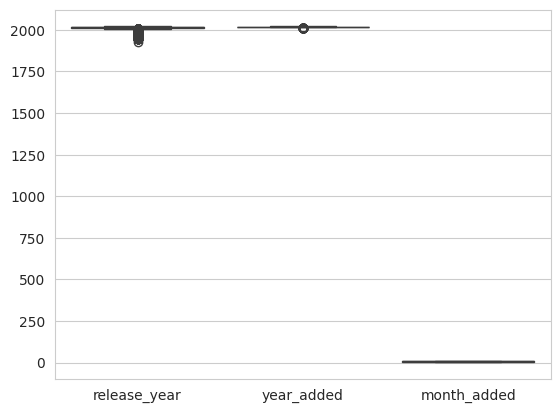

In [ ]:
# Handling Outliers & Outlier treatments

# boxplot for outlier detection
sns.boxplot(data  = df)


##### What all outlier treatment techniques have you used and why did you use those techniques?

Answer Here.

### 3. Categorical Encoding

In [ ]:
# Encode your categorical columns

#### What all categorical encoding techniques have you used & why did you use those techniques?

Answer Here.

### 4. Textual Data Preprocessing
(It's mandatory for textual dataset i.e., NLP, Sentiment Analysis, Text Clustering etc.)

**What is textual data preprocessing?**

Textual data preprocessing is the process of preparing text data for analysis or modeling. It includes a series of steps that are applied to raw text data in order to clean, organize and standardize it so that it can be easily analyzed or used as input for natural language processing or machine learning models. The preprocessing steps typically include tokenization, stop-word removal, stemming or lemmatization, lowercasing, removing punctuation, and removing numbers. The goal of textual data preprocessing is to prepare the data for further analysis and modeling by removing irrelevant information and standardizing the format of the text. This can help improve the accuracy and effectiveness of the analysis or modeling.

#### 1. Expand Contraction

We will cluster the Netflix movies and TV shows into groups based on the following textual characteristics:

* Description, Rating, Country, Listed in (genres) , Cast











In [11]:
# Expand Contraction
# creating tags column using all text column which one is used for model building purpose.
# The purpose of this column is to store text data that will be used for model building

df['tags'] = df['description'] + ' ' + df['rating'] + ' ' + df['country'] + ' ' + df['listed_in'] + ' ' + df['cast']

In [12]:
df['tags'].head()

,tags
0,In a future where the elite inhabit an island ...
1,After a devastating earthquake hits Mexico Cit...
2,"When an army recruit is found dead, his fellow..."
3,"In a postapocalyptic world, rag-doll robots hi..."
4,A brilliant group of students become card-coun...


#### 2. Lower Casing

In [13]:
# Lower Casing
def lower_case(text):
    return text.lower()

df['tags'] = df['tags'].apply(lower_case)
print(df['tags'].head())

0    in a future where the elite inhabit an island ...
1    after a devastating earthquake hits mexico cit...
2    when an army recruit is found dead, his fellow...
3    in a postapocalyptic world, rag-doll robots hi...
4    a brilliant group of students become card-coun...
Name: tags, dtype: object


#### 3. Removing Punctuations

In [14]:
# Remove Punctuations
import string
def remove_punctuation(text):
    return text.translate(str.maketrans('', '', string.punctuation))

df['tags'] = df['tags'].apply(remove_punctuation)
print(df['tags'][110])

after launching a successful underground restaurant out of their apartment an ambitious chef and his wife open an allconsuming upscale eatery tvma united states documentaries jake bickelhaupt


#### 4. Removing URLs & Removing words and digits contain digits.

In [15]:
# Remove URLs & Remove words and digits contain digits
def remove_url_and_digits(text):
    # Replacing the URL's with no space
    url_number_pattern = re.compile(r'https?://\S+|www\.\S+')
    text = re.sub(url_number_pattern,'', text)

    # Replacing the digits with one space
    text = re.sub('[^a-zA-Z]', ' ', text)

    # return the text stripped off URL's and Numbers
    return text

In [16]:
df['tags']= df['tags'].apply(remove_url_and_digits)
print(df['tags'][10])

a farmer pens a confession admitting to his wifes murder but her death is just the beginning of a macabre tale based on stephen kings novella tvma united states dramas thrillers thomas jane molly parker dylan schmid kaitlyn bernard bob frazer brian darcy james neal mcdonough


#### 5. Removing Stopwords & Removing White spaces

In [ ]:
!pip install nltk


[notice] A new release of pip is available: 24.2 -> 25.1.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [17]:
import nltk

In [18]:
# Remove Stopwords
# Downloading stopwords
from nltk.corpus import stopwords
nltk.download('stopwords')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


True

In [19]:
# create a set of English stop words
stop_words1 = set(stopwords.words('english'))

# displaying stopwords
print(stop_words1)
print(f"Total English stop words {len(stop_words1)}")

{'s', 'weren', 'such', "he'd", 'how', 'shouldn', 'themselves', 'they', 'him', "mustn't", 'for', 'his', 'why', 'don', 'here', 'than', 'to', 'those', 'or', "needn't", 'myself', "won't", 'because', 'the', "aren't", 'very', 'and', 't', 'not', 'over', 'their', 'was', 'again', 'once', 'ourselves', 'were', 'under', 'y', 'with', "wasn't", 'are', "he'll", 'below', "didn't", 'having', 'of', 'who', 'that', "she'd", 'this', 'yours', 'had', 'more', 'off', 'other', "it'll", 'i', 'ain', "we'll", 'at', 'when', "you've", 'each', 'it', "isn't", 'few', "i'll", 'isn', "they'll", "you'd", "i've", "weren't", 'out', 'me', 'yourself', 'is', 'my', 'too', 'while', 'any', 'down', 'if', 'during', "mightn't", 'after', 'just', 'wasn', "we'd", 'has', 're', 'into', "haven't", 'herself', 'ours', "she's", "shouldn't", 'through', 've', "he's", 'your', 'on', 'there', 'same', 'now', "couldn't", 'will', 'own', 'no', "they're", "wouldn't", "doesn't", "don't", "it'd", 'as', 'yourselves', 'only', 'being', 'doing', "i'm", 'wha

In [20]:
# Remove White spaces
def remove_stopwords(text):
    words = text.split()
    # Access stop words directly from stopwords module
    filtered_words = [word for word in words if word.lower() not in stopwords.words('english')]
    return ' '.join(filtered_words)

df['tags'] = df['tags'].apply(remove_stopwords)

print(df['tags'][110])

launching successful underground restaurant apartment ambitious chef wife open allconsuming upscale eatery tvma united states documentaries jake bickelhaupt


In [21]:
def remove_whitespace(text):
    # Remove leading/trailing spaces and reduce multiple spaces to a single space
    return re.sub(r'\s+', ' ', text).strip()

df['tags'] = df['tags'].apply(remove_whitespace)
print(df['tags'][110])

launching successful underground restaurant apartment ambitious chef wife open allconsuming upscale eatery tvma united states documentaries jake bickelhaupt


#### 6. Rephrase Text

In [ ]:
# Rephrase Text

#### 7. Tokenization

In [ ]:
#!pip uninstall nltk -y

In [ ]:
#!pip install nltk

In [22]:
# Tokenization
# Loading Libraries
import nltk
from nltk.tokenize import word_tokenize

# Downloading needed libraries
nltk.download('punkt')
nltk.download('punkt_tab')

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package punkt_tab to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt_tab.zip.


True

In [23]:
df['tags'] = df['tags'].apply(word_tokenize)

In [24]:
print(df['tags'].head())

0    [future, elite, inhabit, island, paradise, far...
1    [devastating, earthquake, hits, mexico, city, ...
2    [army, recruit, found, dead, fellow, soldiers,...
3    [postapocalyptic, world, ragdoll, robots, hide...
4    [brilliant, group, students, become, cardcount...
Name: tags, dtype: object


#### 8. Text Normalization

Text normalization means transforming words into their base or standard form so that similar words are treated the same. This helps improve the quality of text analysis tasks like sentiment analysis, classification, and search.

**Stemming** :- Reduces words to their **root form** (not always a real word).

* Fast but less accurate.

* Example: playing, played, plays → play

**Lemmatization**:- Converts **words to their dictionary (base) form** (lemma).
* Uses context and **grammar rules**.
* Slow but accurate.
* Example: running, ran → run
--------
Need fast processing (like, search engines)? - Stemming.

Need accurate, meaningful text analysis (like, NLP models)?	- Lemmatization


In [25]:
# Normalizing Text (i.e., Stemming, Lemmatization etc.)
from nltk.stem.snowball import SnowballStemmer

In [26]:
# Initialize the SnowballStemmer for English
stemmer = SnowballStemmer(language='english')
# Function to apply stemming to a list of words
def stem_words(text):
    text = [stemmer.stem(word) for word in text]
    return " ".join(text)

# Apply the stemmer to your 'tags' column
df['tags'] = df['tags'].apply(stem_words)

#result for the function created
print(df['tags'][0])

futur elit inhabit island paradis far crowd slum get one chanc join save squalor tvma brazil intern tv show tv drama tv scifi fantasi jo miguel bianca comparato michel gome rodolfo valent vaneza oliveira rafael lozano vivian porto mel fronckowiak sergio mamberti zez motta celso frateschi


In [27]:
df['tags'].head()

,tags
0,futur elit inhabit island paradis far crowd sl...
1,devast earthquak hit mexico citi trap survivor...
2,armi recruit found dead fellow soldier forc co...
3,postapocalypt world ragdol robot hide fear dan...
4,brilliant group student becom cardcount expert...


##### Which text normalization technique have you used and why?

I used **stemming**, specifically the Snowball Stemmer. Snowball Stemmer is
more aggressive and consistent than Porter Stemmer, and usually better for English and other supported languages.

**Stemming** is a text normalization technique in Natural Language Processing (NLP) used to reduce words to their root form (stem). The goal is to treat different forms of a word (e.g., connect, connected, connecting) as the same word.


#### 9. Part of speech tagging

In [28]:
# POS Tagging
import nltk
nltk.download('punkt')
nltk.download('averaged_perceptron_tagger')
nltk.download('averaged_perceptron_tagger_eng')
from nltk import pos_tag

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /root/nltk_data...
[nltk_data]   Unzipping taggers/averaged_perceptron_tagger.zip.
[nltk_data] Downloading package averaged_perceptron_tagger_eng to
[nltk_data]     /root/nltk_data...
[nltk_data]   Unzipping taggers/averaged_perceptron_tagger_eng.zip.


In [29]:
# POS Taging
# Assuming 'tags' column has comma-separated words as strings
# Tokenize and apply POS tagging
def pos_tagging(text):
  tokens = nltk.word_tokenize(text)
  tagged_tokens = nltk.pos_tag(tokens) # Specify lang='eng'
  return tagged_tokens

df['pos_tagging'] = df['tags'].apply(pos_tagging)
#Use code with caution

In [30]:
df['pos_tagging'].head(5)

,pos_tagging
0,"[(futur, NN), (elit, NN), (inhabit, NN), (isla..."
1,"[(devast, NN), (earthquak, NN), (hit, VBD), (m..."
2,"[(armi, NN), (recruit, NN), (found, VBN), (dea..."
3,"[(postapocalypt, JJ), (world, NN), (ragdol, NN..."
4,"[(brilliant, JJ), (group, NN), (student, NN), ..."


#### 10. Text Vectorization

Text vectorization is the process of converting textual data into numerical representations (vectors) that machine learning algorithms can understand and process. It transforms unstructured text into a structured format, enabling analysis and manipulation by algorithms. This conversion allows for various NLP tasks like classification, clustering, and prediction by capturing the semantic meaning and contextual relationships within the text.

Methods:
Bag-of-words (BoW): A simple approach where each document is represented by a vector of word counts.

**TF-IDF (Term Frequency-Inverse Document Frequency)**: A weighted BoW method that assigns relevance scores based on word frequency and document frequency.

Word embeddings: Techniques like Word2Vec and GloVe that map words to vectors in a continuous space, capturing semantic relationships.

In [31]:
from sklearn.feature_extraction.text import TfidfVectorizer # Import TfidfVectorizer

In [32]:
# Vectorizing Text
tf_idf = TfidfVectorizer(stop_words='english', lowercase=True,max_features=30000)
tf_idf.fit(df['tags'])
#
dictionary = tf_idf.vocabulary_.items()

In [33]:
# Convert vector into array form for clustering
vector = tf_idf.transform(df['tags']).toarray()
# Summarize encoded vector
print(vector)

[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


In [ ]:
#print(df.head(10))
print("Features:", tf_idf.get_feature_names_out())
print(f'shape of the vector : {vector.shape}')

Features: ['aadarsh' 'aadhi' 'aaditi' ... 'zygmunt' 'zylberberg' 'zylka']
shape of the vector : (7770, 30000)


##### Which text vectorization technique have you used and why?

I used TF-IDF (Term Frequency–Inverse Document Frequency) vectorization technique.

TF-IDF or Term Frequency–Inverse Document Frequency, is a numerical statistic that’s intended to reflect how important a word is to a document. Although it’s another frequency-based method, it’s not as naive as Bag of Words.

**Why TF-IDF?**

TF-IDF if you want a balance of performance and simplicity for traditional ML models.

It not only counts how frequently a word appears in a document (like Bag of Words), but also penalizes common words that appear in many documents. This helps highlight more informative or unique words.

Unlike Bag of Words, TF-IDF reduces the weight of stopwords or high-frequency, low-meaning words.

### 7. Dimesionality Reduction

##### Do you think that dimensionality reduction is needed? Explain Why?

In textual data processing, especially when using **vectorization techniques like TF-IDF or CountVectorizer**, we often end up with a very high number of features—in this case, **around 30,000(Vector) attributes**. This creates a high-dimensional sparse matrix that can be computationally expensive and inefficient to handle on local machines.

To manage this complexity, we apply **Principal Component Analysis** (PCA). PCA helps by reducing the number of features while retaining most of the important information (variance) from the original data. **This not only improves model performance and training speed, but also helps in avoiding overfitting and making the data more manageable.**

In [34]:
# Dimensionality Reduction (If needed)
#PCA
from sklearn.decomposition import PCA
pca = PCA()
pca.fit(vector)

PCA()

In [35]:
var_exp=pca.explained_variance_ratio_
var_exp

array([5.29008898e-03, 4.81927954e-03, 3.96550418e-03, ...,
       2.14808175e-35, 1.00503279e-35, 1.86389298e-36])

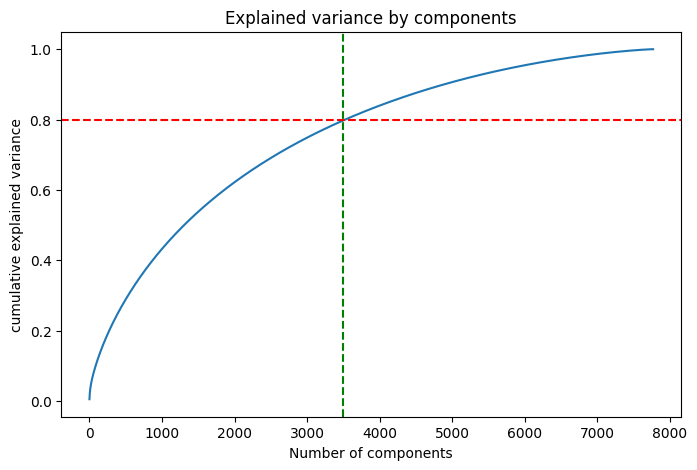

In [36]:
plt.figure(figsize=(8,5))
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.axhline(y= 0.8, color='red', linestyle='--')
plt.axvline(x= 3500, color='green', linestyle='--')

plt.xlabel('Number of components')
plt.ylabel('cumulative explained variance')
plt.title('Explained variance by components')
plt.show()

Observations:

* We find that around **7770 components** account for **100% of the variance.**
* Also, just 3500 components comprise more than 80% of the variation
* As a result, we can pull the top 3500 components out of the model to make it simpler and less dimensional while still being able to account for more than 80% of variance.

In [37]:
# Automatically choose the number of components to retain 80% variance
pca = PCA(n_components=3500,random_state=32)
# Fit data
pca.fit(vector)

PCA(n_components=3500, random_state=32)

In [38]:
# Transformed features
X_reduced = pca.fit_transform(vector)
# Number of components selected
print(f"Number of components chosen: {pca.n_components_}")
print(f"Reduced shape: {X_reduced.shape}")

Number of components chosen: 3500
Reduced shape: (7770, 3500)


In [39]:
#Check the shape of the reduced matrix
print("Original shape:", vector.shape)
print("Reduced shape :", X_reduced.shape)

Original shape: (7770, 30000)
Reduced shape : (7770, 3500)


##### Which dimensionality reduction technique have you used and why? (If dimensionality reduction done on dataset.)

We can use **PCA (Principal component Analysis)** to reduce the dimensionality of data.

Dimensionality reduction is the process of reducing the number of features or dimensions in a dataset while preserving as much information as possible. It is a common step in machine learning and data analysis, as high-dimensional datasets can be difficult to work with and can sometimes suffer from the curse of dimensionality.

## ***7. ML Model Implementation***

### ML Model - **K-Means Clustering**

In [ ]:
!pip install yellowbrick

In [41]:
from sklearn.cluster import KMeans
from yellowbrick.cluster import KElbowVisualizer
from sklearn.metrics import silhouette_score

The KElbowVisualizer from the yellowbrick library provides a simple way to automatically visualize the elbow curve for K-Means clustering, making it easier to choose the optimal number of clusters.

**K-means clustering** is a type of unsupervised machine learning algorithm used for partitioning a dataset into K clusters based on similarity of data points. The goal of the algorithm is to minimize the sum of squared distances between each data point and its **corresponding cluster centroid.** It works iteratively by assigning each data point to its nearest centroid and then re-computing the centroid of each cluster based on the new assignments. The algorithm terminates when the cluster assignments no longer change or when a maximum number of iterations is reached.

**Elbow Method** :

The Elbow method is one of the most popular ways to **find the optimal number of clusters**. This method uses the concept of WCSS value. WCSS stands for **Within Cluster Sum of Squares**, which defines the **total variations within a cluster**.

**Finding the ideal number of clusters for the K-means clustering algorithm requires visualising the elbow curve and Silhouette score.**

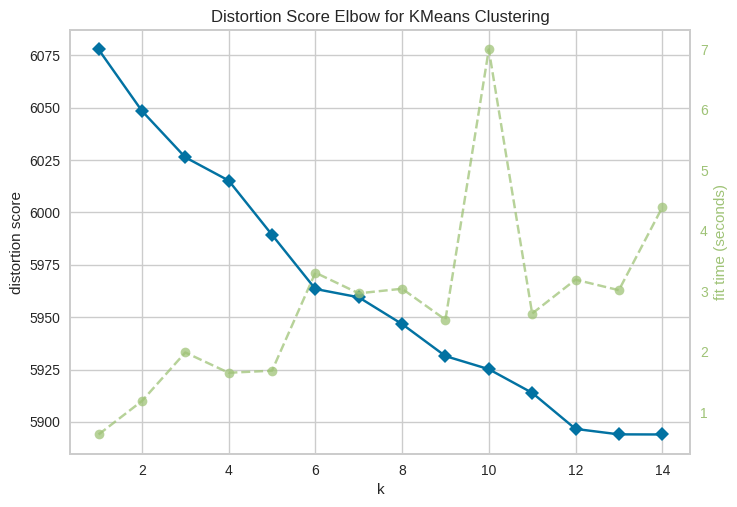

<Axes: title={'center': 'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [42]:
# ML Model - 1 Implementation
model = KMeans()
# automatically visualize the elbow curve for K-Means clustering
visualizer = KElbowVisualizer(model, k=(1,15),locate_elbow=False)
visualizer.fit(X_reduced)
visualizer.show()
# Fit the Algorithm
# Predict on the model

k=2, Silhouette score=0.003692
k=3, Silhouette score=0.004007
k=4, Silhouette score=0.005902
k=5, Silhouette score=0.006828
k=6, Silhouette score=0.007296
k=7, Silhouette score=0.007413
k=8, Silhouette score=0.006797
k=9, Silhouette score=0.006991
k=10, Silhouette score=0.006991
k=11, Silhouette score=0.006937
k=12, Silhouette score=0.007265
k=13, Silhouette score=0.007604
k=14, Silhouette score=0.007356


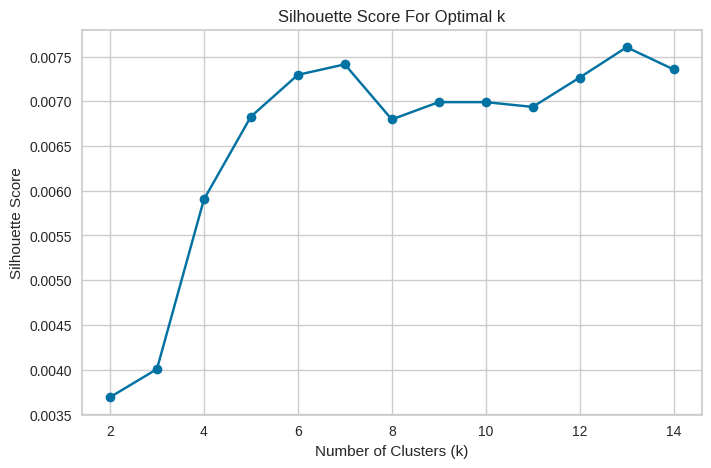

In [43]:
silhouette_scores = []

for k in range(2, 15):  # Silhouette score is not valid for k=1
    kmeans = KMeans(n_clusters=k,random_state=42)
    preds = kmeans.fit_predict(X_reduced)
    score = silhouette_score(X_reduced, preds)
    silhouette_scores.append(score)
    print("k=%d, Silhouette score=%f" % (k, score))

plt.figure(figsize=(8, 5))
plt.plot(range(2, 15), silhouette_scores, marker='o')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Silhouette Score')
plt.title('Silhouette Score For Optimal k')
plt.grid(True)
plt.show()

Silhouette scores range from -1 to 1:

* Closer to 1: Clusters are well-separated and dense.

* Around 0: Clusters are overlapping or ambiguous.

* Negative: Samples are assigned to the wrong clusters.

In [44]:
# Training the K-means model on a dataset
# init='k-means++': A smart way to initialize the centroids to speed up convergence and improve accuracy.
kmeans = KMeans(n_clusters=6, init='k-means++', random_state= 42)
# Fit the Algorithm
kmeans.fit(X_reduced)
# Predict on the model
y_kmeans = kmeans.predict(X_reduced)#Label the dataset as per the cluster.


In [45]:
df['cluster'] = y_kmeans

In [46]:
df.head(5)

,show_id,type,title,director,cast,country,release_year,rating,duration,listed_in,description,year_added,month_added,tags,pos_tagging,cluster
0,s1,TV Show,3%,Unknown,"João Miguel, Bianca Comparato, Michel Gomes, R...",Brazil,2020,TV-MA,4 Seasons,"International TV Shows, TV Dramas, TV Sci-Fi &...",In a future where the elite inhabit an island ...,2020,8,futur elit inhabit island paradis far crowd sl...,"[(futur, NN), (elit, NN), (inhabit, NN), (isla...",1
1,s2,Movie,7:19,Jorge Michel Grau,"Demián Bichir, Héctor Bonilla, Oscar Serrano, ...",Mexico,2016,TV-MA,93 min,"Dramas, International Movies",After a devastating earthquake hits Mexico Cit...,2016,12,devast earthquak hit mexico citi trap survivor...,"[(devast, NN), (earthquak, NN), (hit, VBD), (m...",3
2,s3,Movie,23:59,Gilbert Chan,"Tedd Chan, Stella Chung, Henley Hii, Lawrence ...",Singapore,2011,R,78 min,"Horror Movies, International Movies","When an army recruit is found dead, his fellow...",2018,12,armi recruit found dead fellow soldier forc co...,"[(armi, NN), (recruit, NN), (found, VBN), (dea...",3
3,s4,Movie,9,Shane Acker,"Elijah Wood, John C. Reilly, Jennifer Connelly...",United States,2009,PG-13,80 min,"Action & Adventure, Independent Movies, Sci-Fi...","In a postapocalyptic world, rag-doll robots hi...",2017,11,postapocalypt world ragdol robot hide fear dan...,"[(postapocalypt, JJ), (world, NN), (ragdol, NN...",3
4,s5,Movie,21,Robert Luketic,"Jim Sturgess, Kevin Spacey, Kate Bosworth, Aar...",United States,2008,PG-13,123 min,Dramas,A brilliant group of students become card-coun...,2020,1,brilliant group student becom cardcount expert...,"[(brilliant, JJ), (group, NN), (student, NN), ...",3


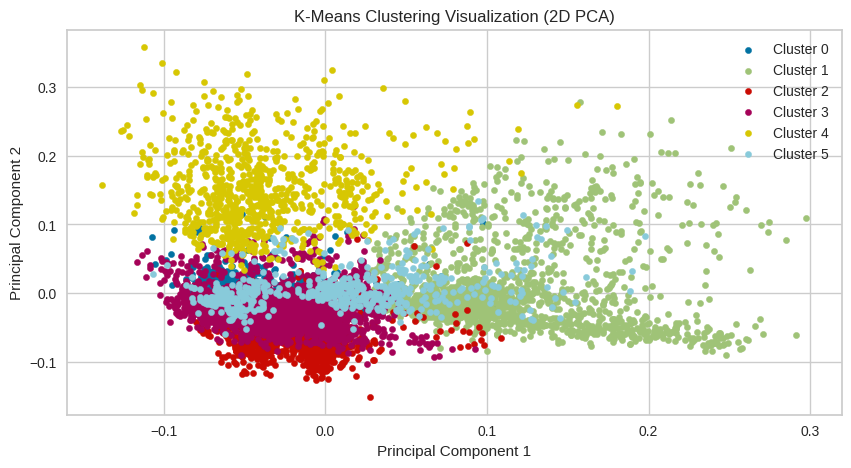

In [47]:
cluster_uni = np.unique(df['cluster'])
# Plot each cluster
plt.figure(figsize=(10, 5))
for label in cluster_uni:
    plt.scatter(X_reduced[y_kmeans == label, 0], X_reduced[y_kmeans == label, 1], label=f'Cluster {label}', s=20)

plt.title('K-Means Clustering Visualization (2D PCA)')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.legend()
plt.grid(True)
plt.show()

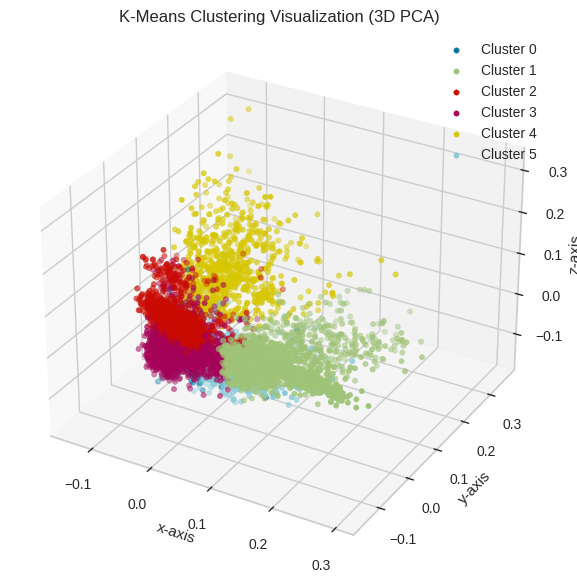

In [48]:
from mpl_toolkits.mplot3d import Axes3D

# Plot each cluster in 3D
fig = plt.figure(figsize=(10, 7))
ax = fig.add_subplot(111, projection='3d')

for label in cluster_uni:
    ax.scatter(
        X_reduced[y_kmeans == label, 0],
        X_reduced[y_kmeans == label, 1],
        X_reduced[y_kmeans == label, 2],
        label=f'Cluster {label}',
        s=15  # Adjust point size
    )

ax.set_title('K-Means Clustering Visualization (3D PCA)')

ax.set_xlabel('x-axis')
ax.set_ylabel('y-axis')
ax.set_zlabel('z-axis')
ax.legend()
plt.show()

#### 1. Explain the ML Model used and it's performance using Evaluation metric Score Chart.

In [ ]:
# Number of movies and tv shows in each cluster
plt.figure(figsize=(10,5))
# Set style
sns.set_style('whitegrid')
ax = sns.countplot(x='cluster',data=df, hue='type')
plt.title('Number of movies and TV Shows in each cluster - Hierarchical Clustering')

# Annotate each bar manually
for container in ax.containers:
    for bar in container:
        ax.text(bar.get_x() + bar.get_width() / 2, bar.get_height() + 22,f'{int(bar.get_height())}',ha='center', va='center',
            fontsize=8, fontweight='bold',color='black')


That plots wordcloud for different attributes using KMeans Clustering.

In [49]:
# Visualizing evaluation Metric Score chart
def plot_wordclouds(cluster_col, text_col):
    clusters = sorted(df[cluster_col].unique())

    for cluster in clusters:
        cluster_texts = df[df[cluster_col] == cluster][text_col].dropna().astype(str)
        full_text = " ".join(cluster_texts)

        # Optional: Clean commas or punctuations for better word separation
        full_text = full_text.replace(',', ' ').replace('.', '')

        wordcloud = WordCloud(width=800, height=200, background_color='white',
                              colormap='Set2', max_words=200).generate(full_text)

        plt.figure(figsize=(12, 4))
        plt.imshow(wordcloud, interpolation='bilinear')
        plt.axis('off')
        plt.title(f"WordCloud for Cluster {cluster} based on '{text_col}'", fontsize=14)
        plt.show()
#df['description'] + ' ' + df['rating'] + ' ' + df['country'] + ' ' + df['listed_in'] + ' ' + df['cast']

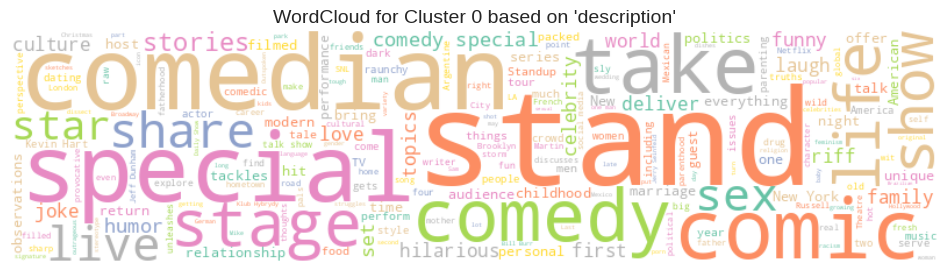

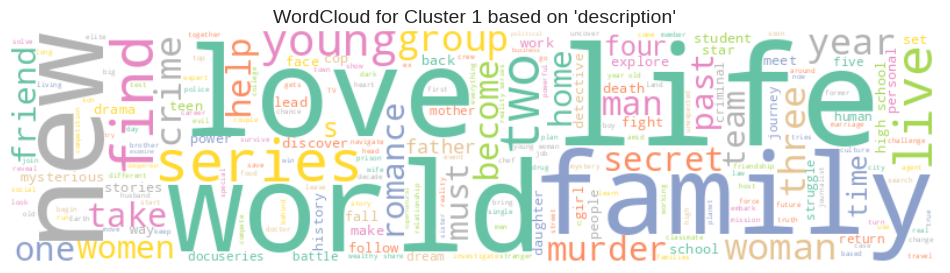

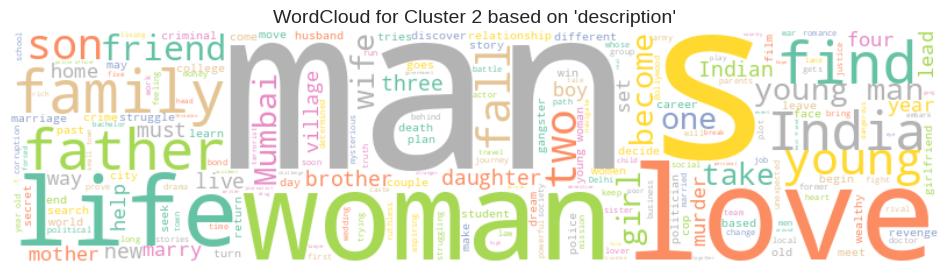

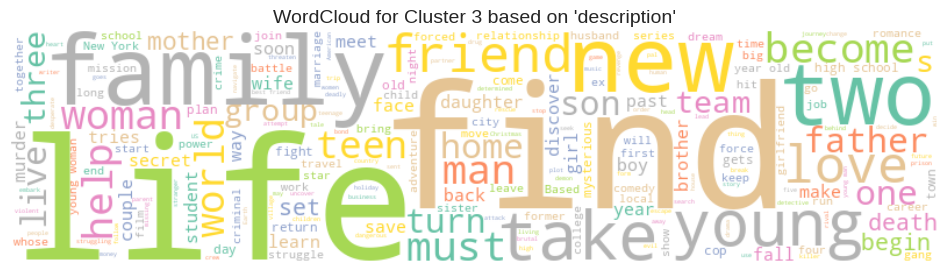

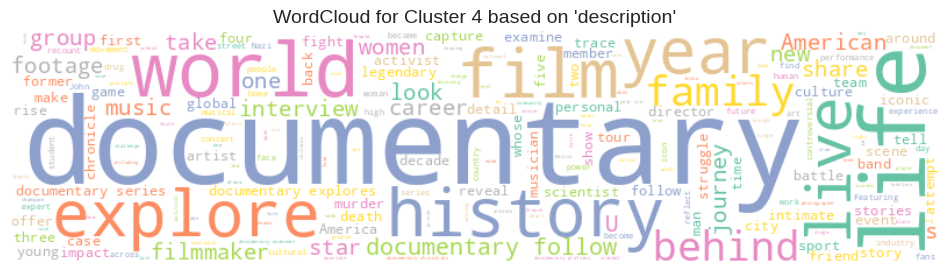

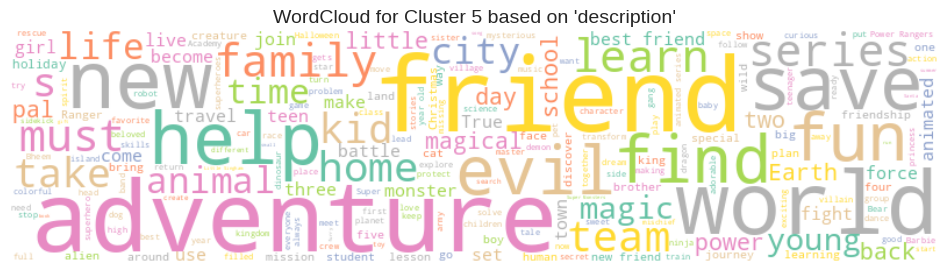

In [50]:
# For 'description'
plot_wordclouds(cluster_col='cluster', text_col='description')

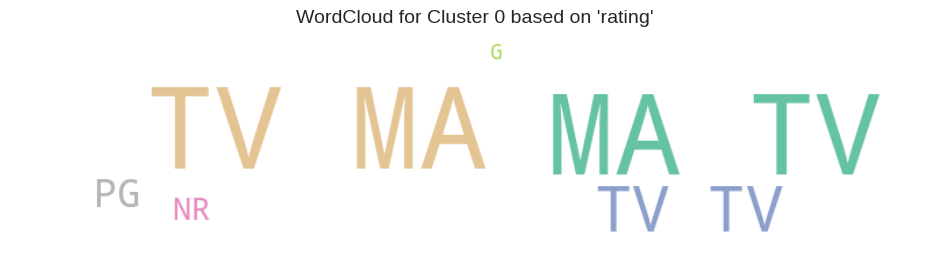

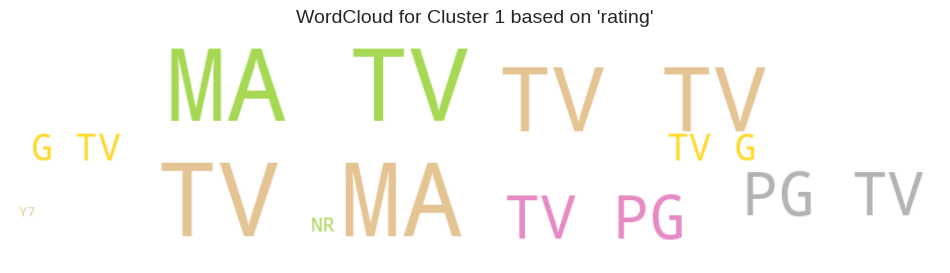

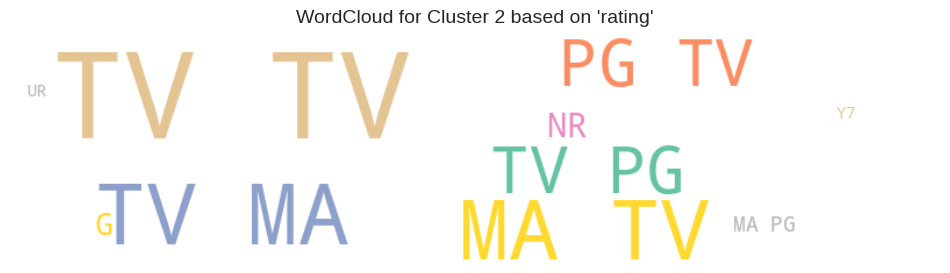

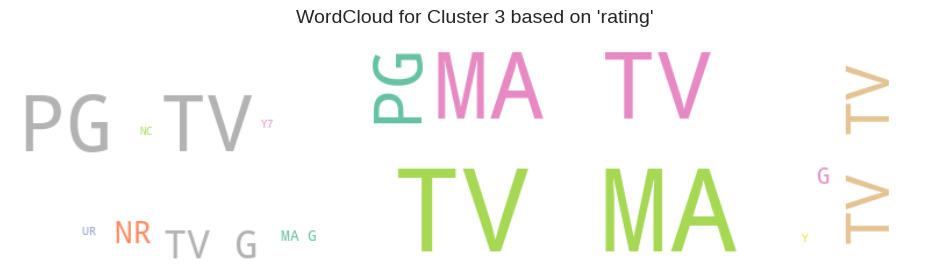

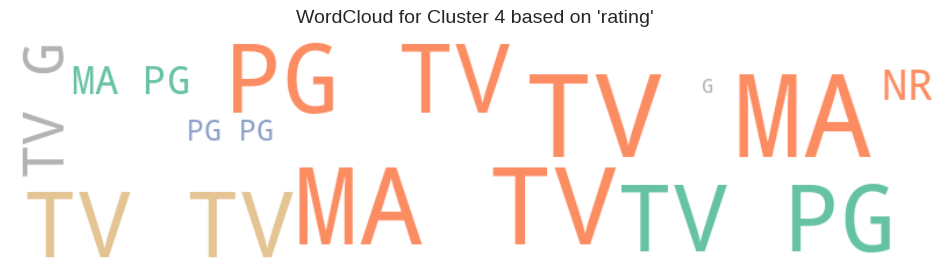

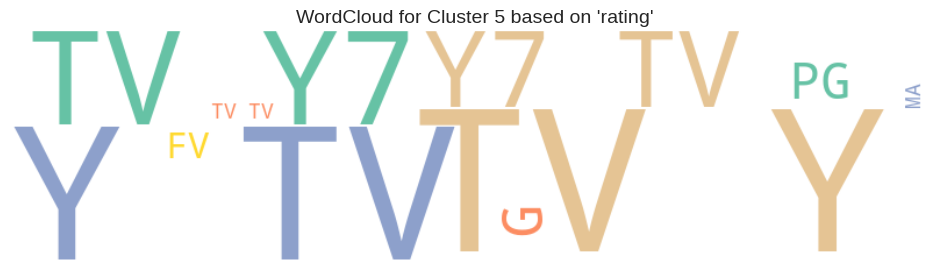

In [51]:
# For 'rating'
plot_wordclouds(cluster_col='cluster', text_col='rating')

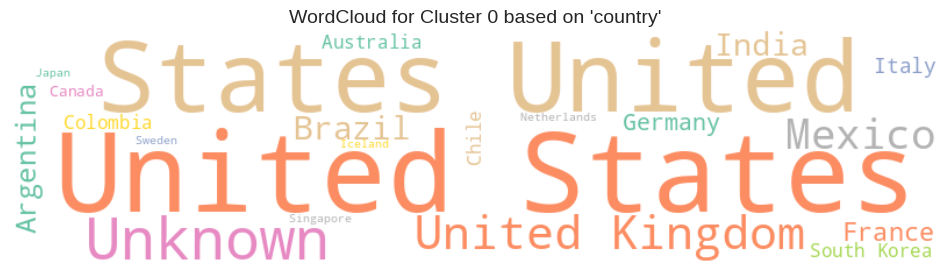

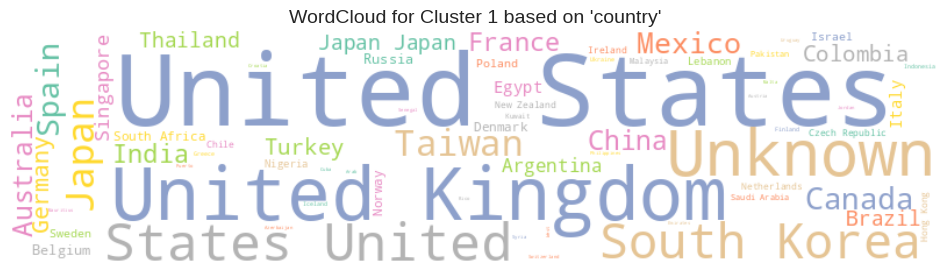

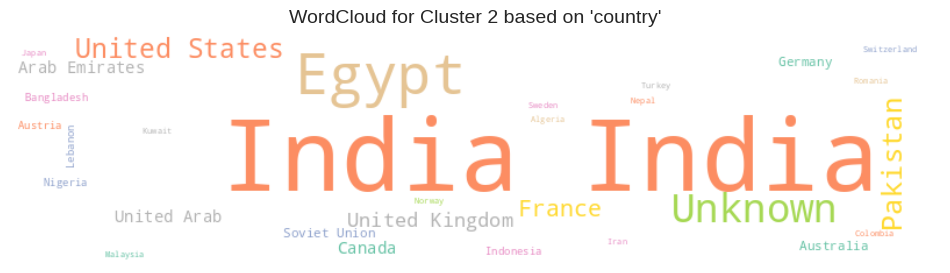

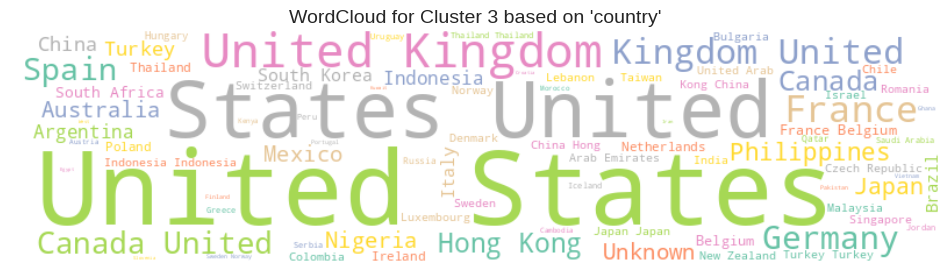

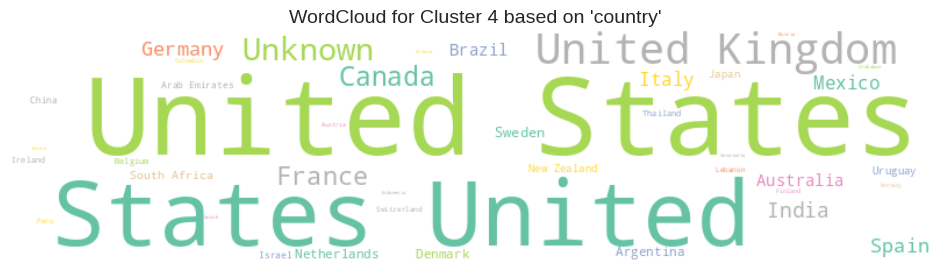

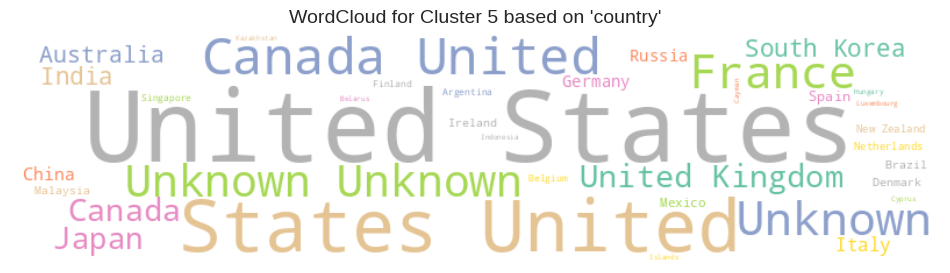

In [52]:
# For 'country'
plot_wordclouds(cluster_col='cluster', text_col='country')

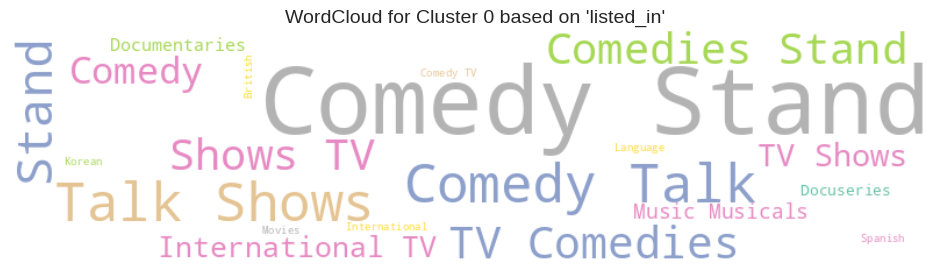

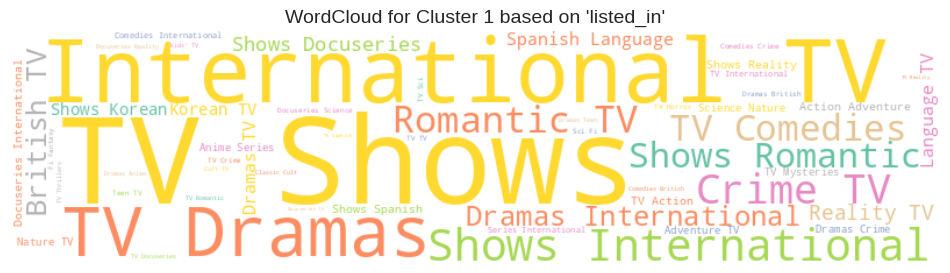

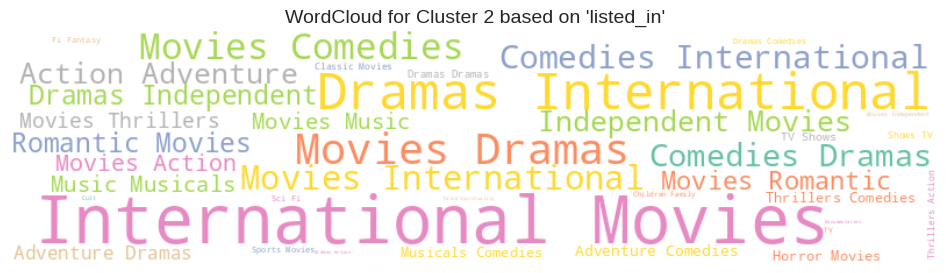

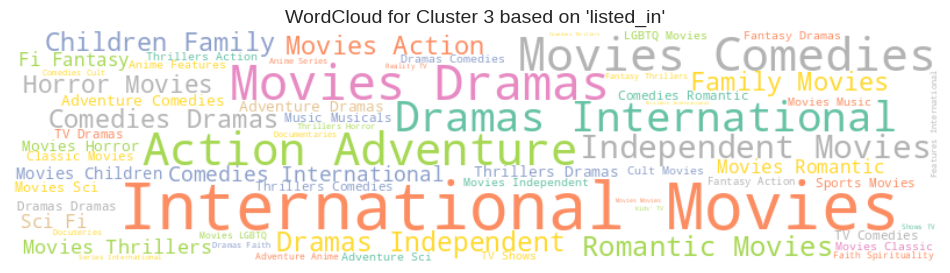

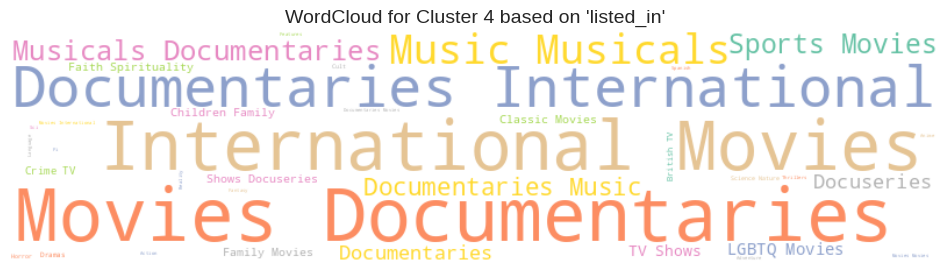

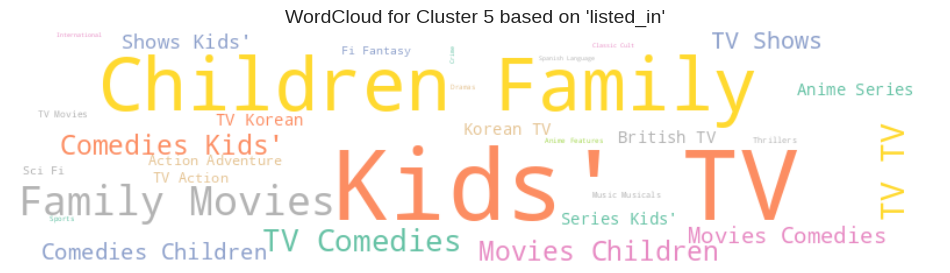

In [53]:
# For 'listed_in' (genres)
plot_wordclouds(cluster_col='cluster', text_col='listed_in')

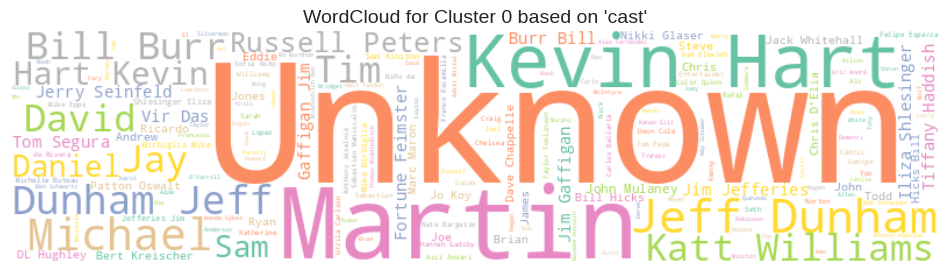

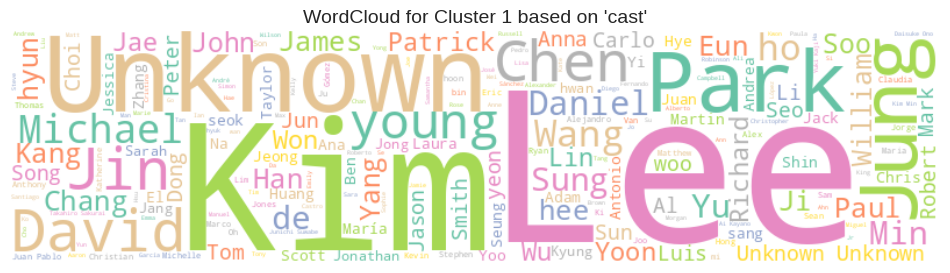

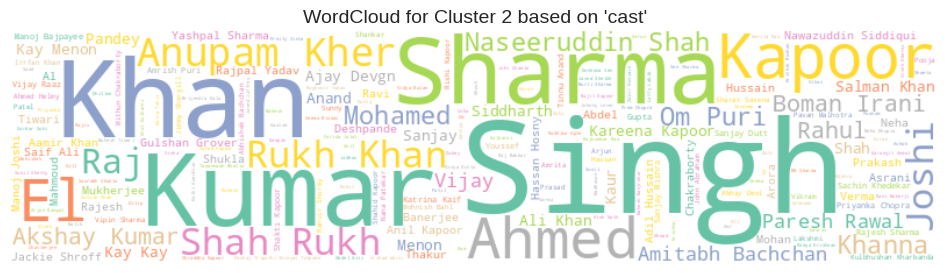

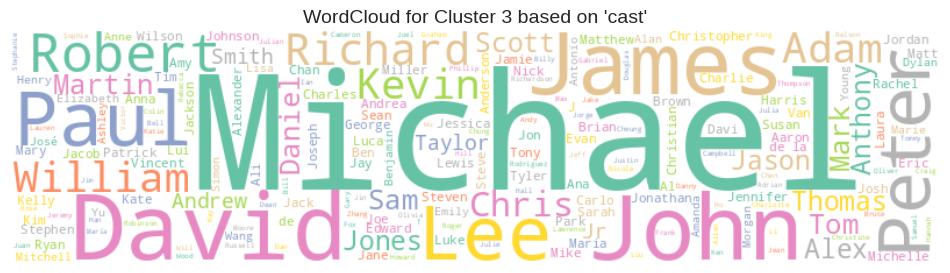

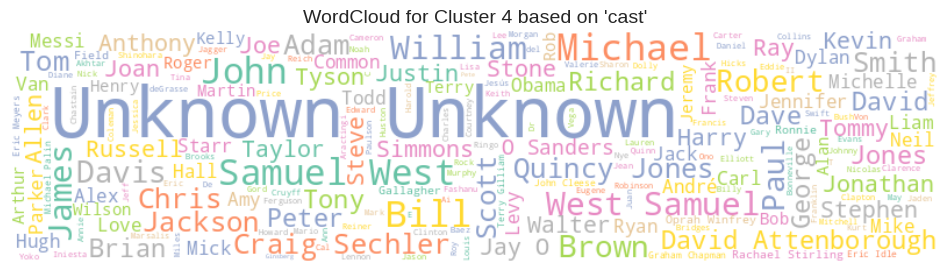

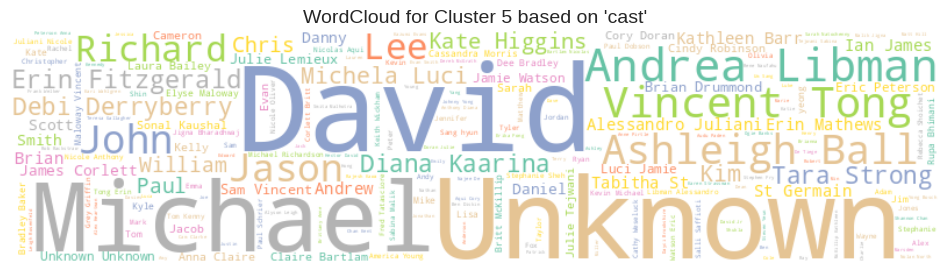

In [54]:
# For 'cast'
plot_wordclouds(cluster_col='cluster', text_col='cast')

### ML Model - 2 Hierarchical Clustering

Hierarchical Clustering is a type of unsupervised learning algorithm used to group similar objects into clusters based on a hierarchy. Unlike K-Means, you don’t need to pre-specify the number of clusters. Instead, the algorithm builds a tree (called a dendrogram) that shows how data points are merged or split

Types of Hierarchical Clustering
1. Agglomerative (Bottom-Up) — Most common :-  Start with each data point as its own cluster.
* Repeatedly merge the closest clusters until one big cluster remains (or a stopping condition is met).
  
2. Divisive (Top-Down) :-  Start with all data points in one cluster.
* Recursively split clusters into smaller ones.

**Agglomerative Clustering**
* The technique used to group data points based on their similarity in a bottom-up approach.

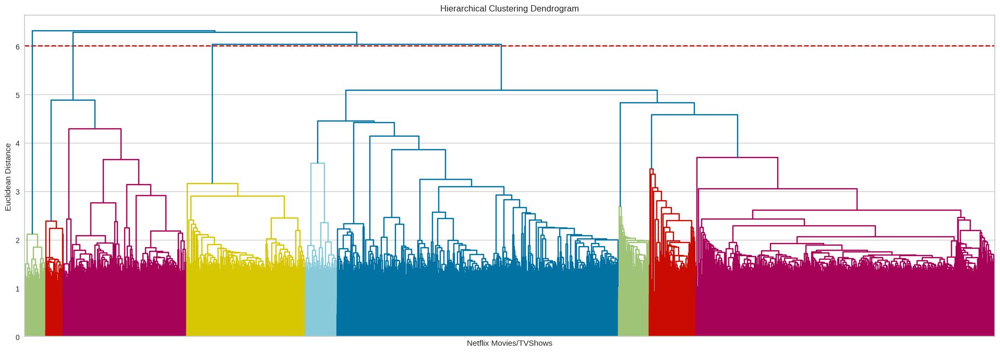

In [56]:
from scipy.cluster.hierarchy import linkage, dendrogram

# HIERARCHICAL CLUSTERING
distances_linkage = linkage(X_reduced, method = 'ward')
plt.figure(figsize=(24, 8))
plt.title('Hierarchical Clustering Dendrogram')
plt.xlabel('Netflix Movies/TVShows')
plt.ylabel('Euclidean Distance')
plt.axhline(y=6,color='r',linestyle='--')
dendrogram(distances_linkage, no_labels = True)
plt.show()

A **Dendrogram** is a tree-like diagram used to visualize the hierarchical relationships between data points in Hierarchical Clustering, especially Agglomerative Clustering. It helps you determine the optimal number of clusters by identifying the longest vertical distance (gap) that can be cut without crossing any horizontal lines.

This graph we can say that optimal number of **clusters is 6**.

In [57]:
from sklearn.cluster import AgglomerativeClustering
scores = []
for k in range(2, 11):
    model = AgglomerativeClustering(n_clusters=k, metric='euclidean', linkage='ward')
    labels = model.fit_predict(X_reduced)
    score = silhouette_score(X_reduced, labels)
    scores.append(score)
    print("k=%d, Silhouette score=%f" % (k, score))
# Plot

# plt.plot(range(2, 11), scores, marker='o')
# plt.xlabel('Number of clusters')
# plt.ylabel('Silhouette Score')
# plt.title('Agglomerative Clustering: Silhouette Scores vs Number of Clusters')
# plt.grid(True)
# plt.show()


k=2, Silhouette score=-0.011010
k=3, Silhouette score=-0.009478
k=4, Silhouette score=-0.008037
k=5, Silhouette score=-0.007105
k=6, Silhouette score=-0.007163
k=7, Silhouette score=-0.006454
k=8, Silhouette score=-0.005642
k=9, Silhouette score=-0.004984
k=10, Silhouette score=-0.004233


In [58]:
from sklearn.cluster import AgglomerativeClustering
agg_cluter = AgglomerativeClustering(n_clusters=6 ,metric='euclidean', linkage='ward')
# Fit the data to the Agglomerative cluster
agg_cluter.fit(X_reduced)

# Predict on the model
y_agg_hierac = agg_cluter.fit_predict(X_reduced)

In [59]:
df['agg_hierarchical_cluster'] = y_agg_hierac
np.unique(df['agg_hierarchical_cluster'])

array([0, 1, 2, 3, 4, 5])

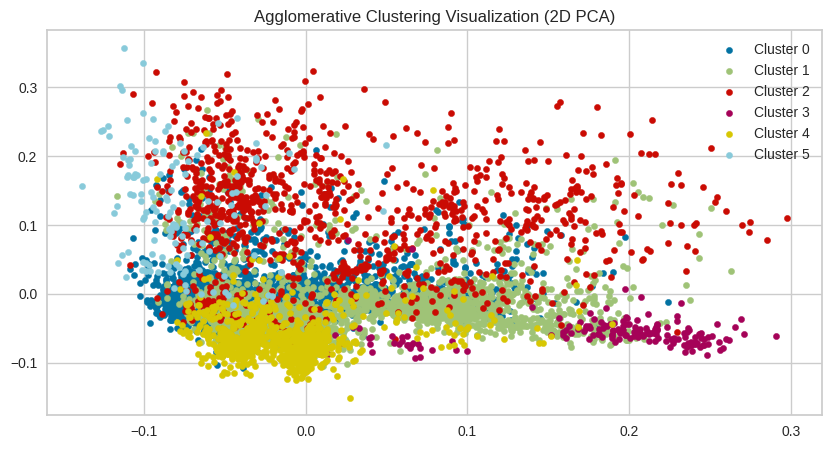

In [60]:
agg_hierarchical_uni = np.unique(df['agg_hierarchical_cluster'])
# Plot each cluster
plt.figure(figsize=(10, 5))
for label in agg_hierarchical_uni:
    plt.scatter(X_reduced[y_agg_hierac == label, 0], X_reduced[y_agg_hierac == label, 1], label=f'Cluster {label}', s=20)

plt.title('Agglomerative Clustering Visualization (2D PCA)')
plt.legend()
plt.show()

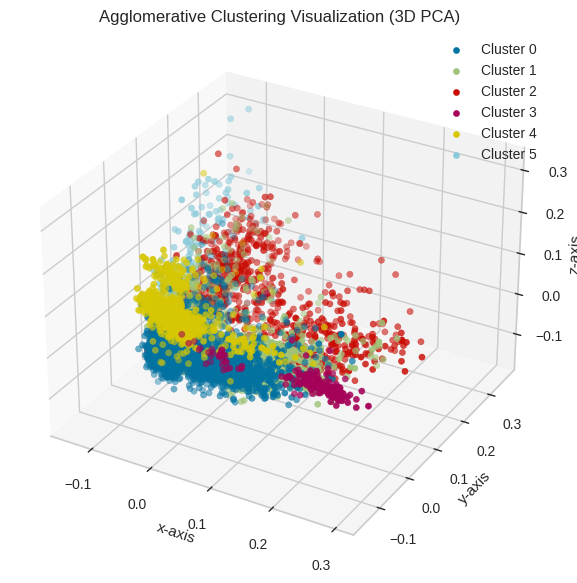

In [61]:
from mpl_toolkits.mplot3d import Axes3D

# Plot each cluster in 3D
fig = plt.figure(figsize=(10, 7))
ax = fig.add_subplot(111, projection='3d')

for label in agg_hierarchical_uni:
    ax.scatter(X_reduced[y_agg_hierac == label, 0], X_reduced[y_agg_hierac == label, 1], X_reduced[y_agg_hierac == label, 2],
        label=f'Cluster {label}',s=20  # Adjust point size
    )

ax.set_title('Agglomerative Clustering Visualization (3D PCA)')
ax.set_xlabel('x-axis')
ax.set_ylabel('y-axis')
ax.set_zlabel('z-axis')
ax.legend()
plt.show()

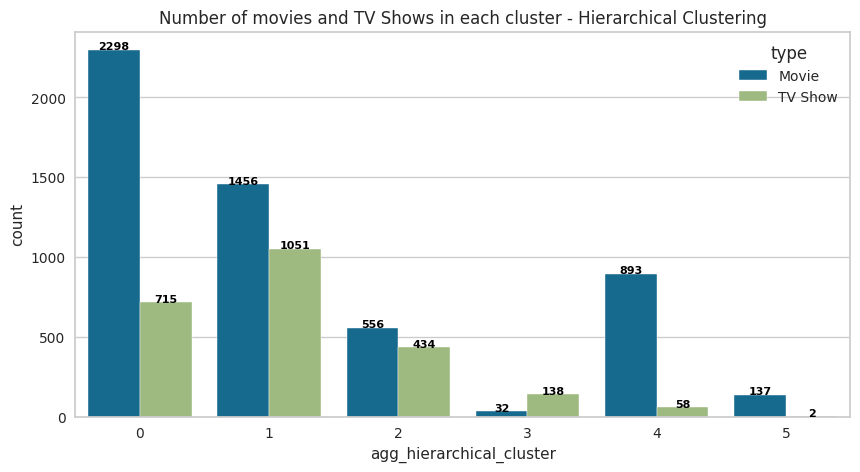

In [83]:
# Number of movies and tv shows in each cluster
plt.figure(figsize=(10,5))
# Set style
sns.set_style('whitegrid')
ax = sns.countplot(x='agg_hierarchical_cluster',data=df, hue='type')
plt.title('Number of movies and TV Shows in each cluster - Hierarchical Clustering')

# Annotate each bar manually
for container in ax.containers:
    for bar in container:
        ax.text(bar.get_x() + bar.get_width() / 2, bar.get_height() + 22,f'{int(bar.get_height())}',ha='center', va='center',
            fontsize=8, fontweight='bold',color='black')


#### 1. Explain the ML Model used and it's performance using Evaluation metric Score Chart.

That plots wordcloud for different attributes using Agglomerative Clustering.

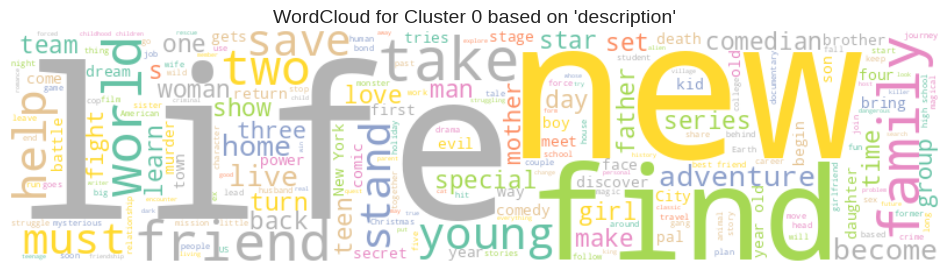

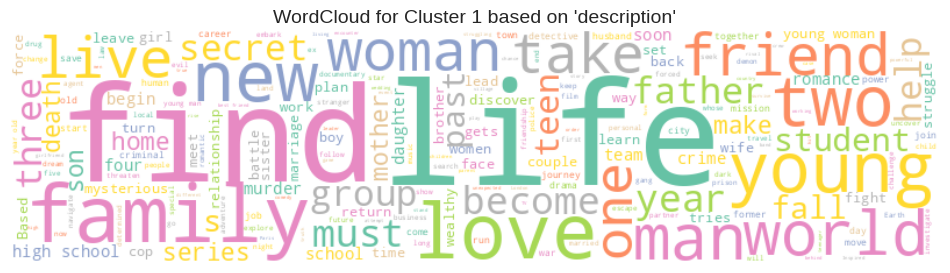

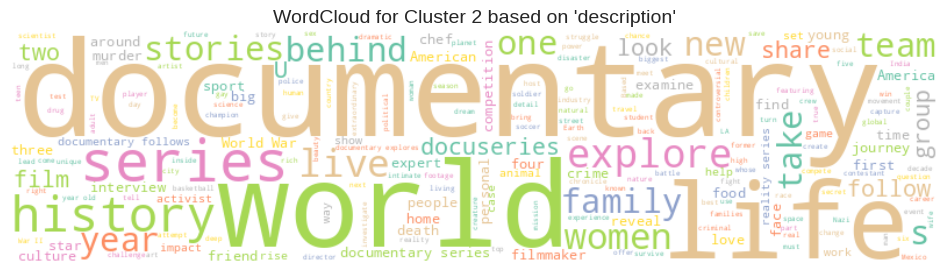

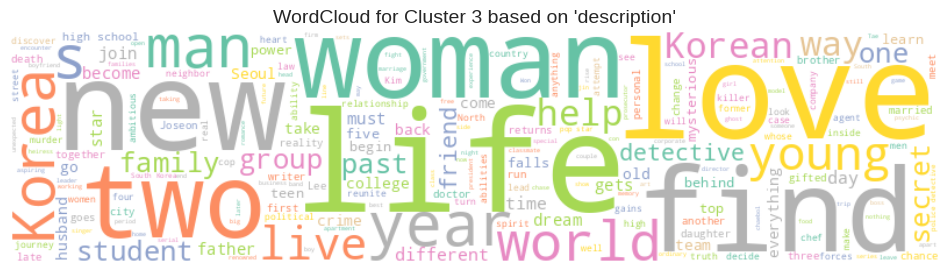

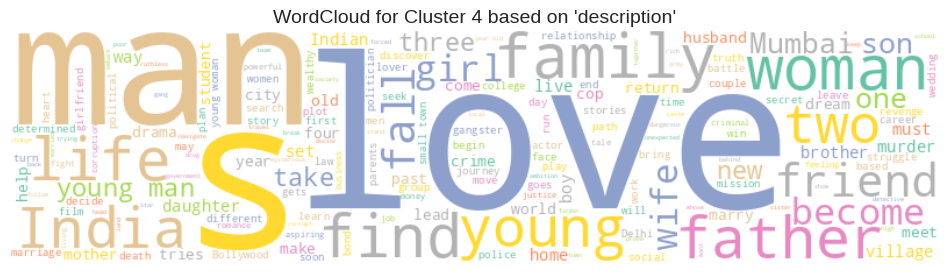

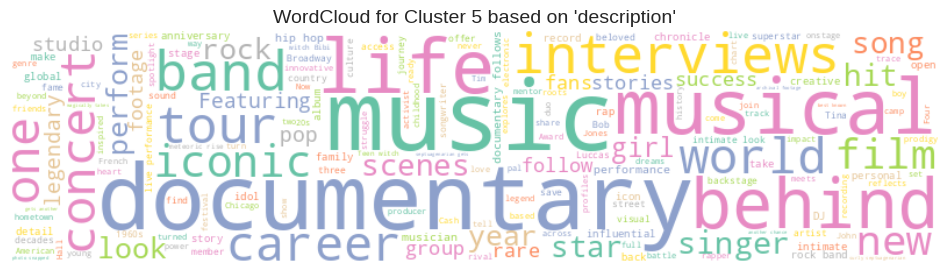

In [63]:
# Visualizing evaluation Metric Score chart
# For 'description'
plot_wordclouds(cluster_col='agg_hierarchical_cluster', text_col='description')

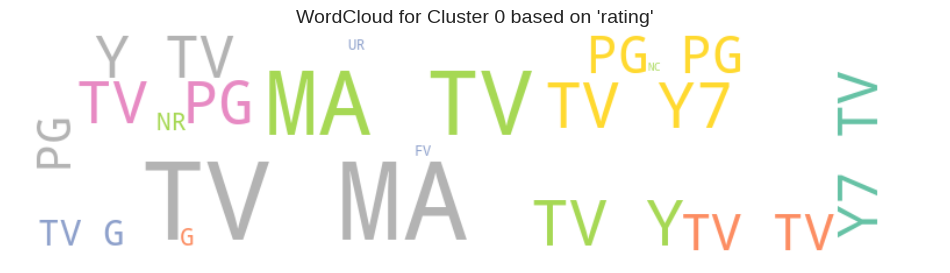

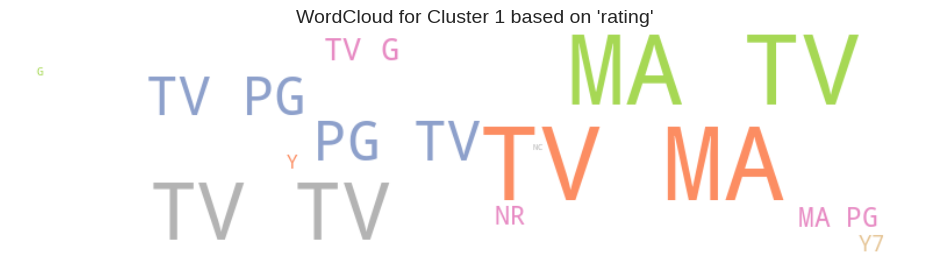

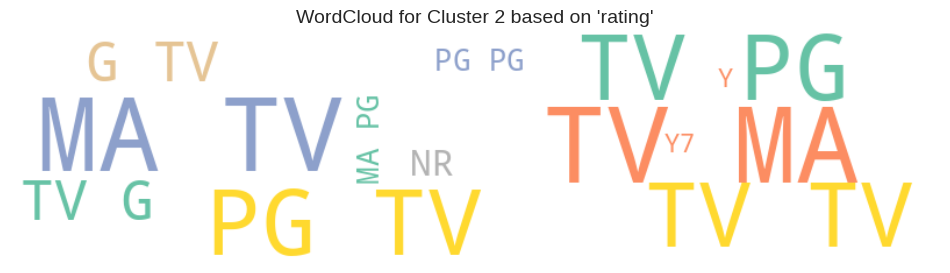

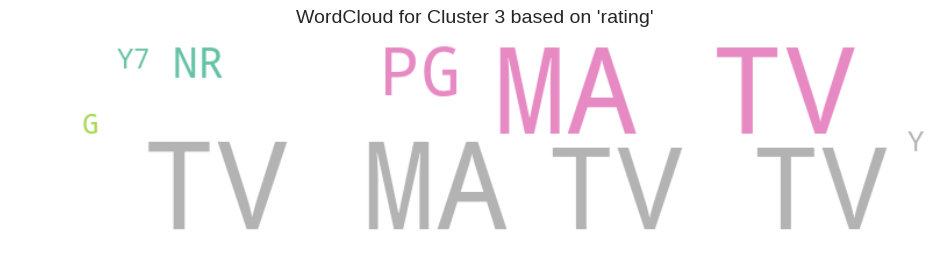

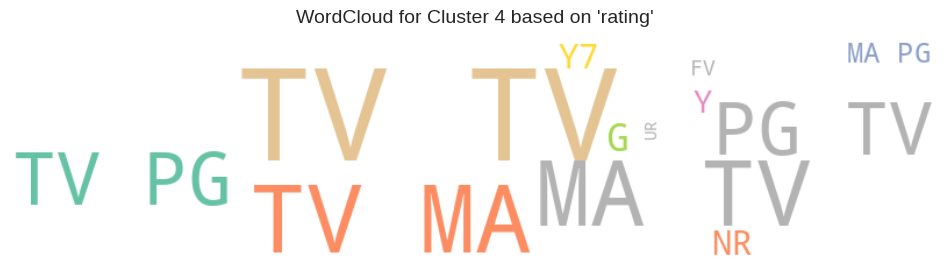

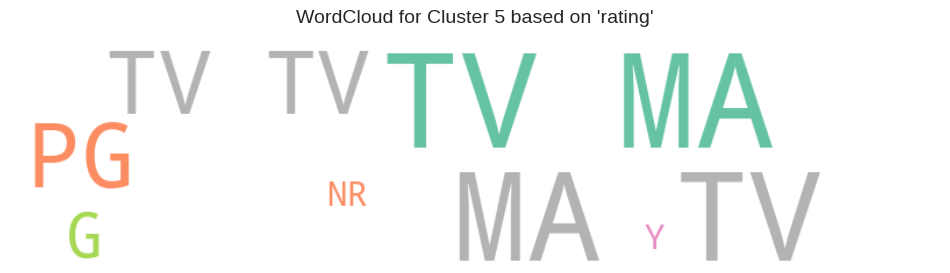

In [64]:
# For 'rating'
plot_wordclouds(cluster_col='agg_hierarchical_cluster', text_col='rating')

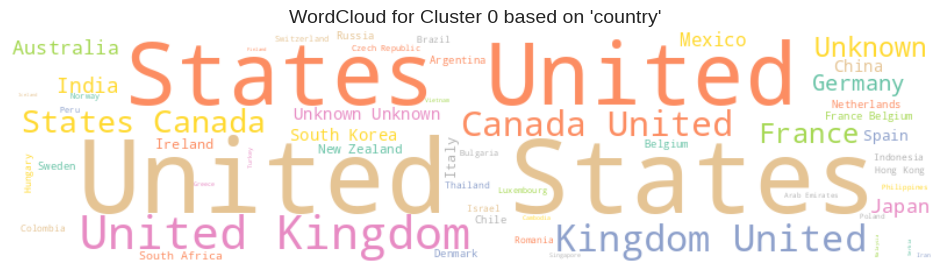

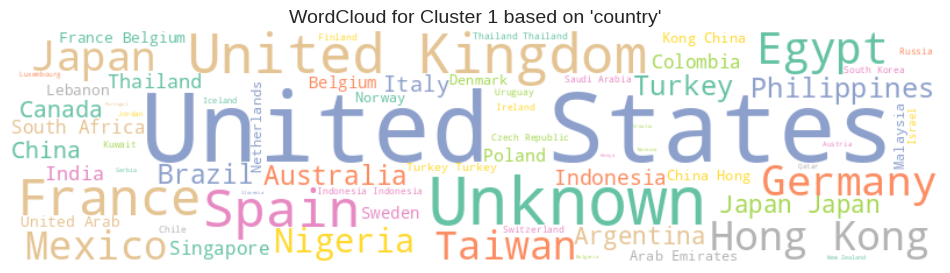

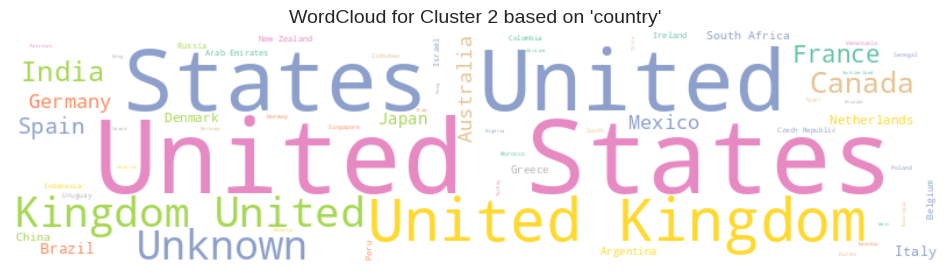

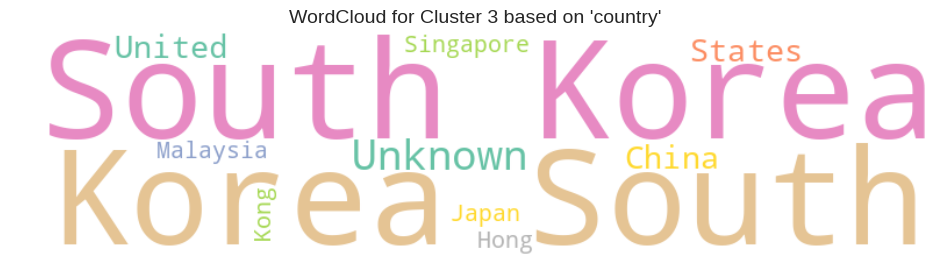

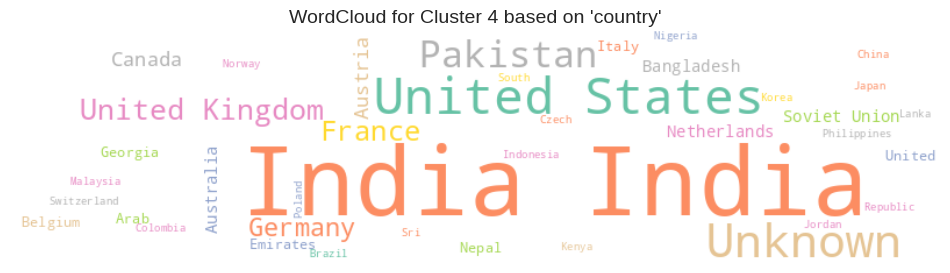

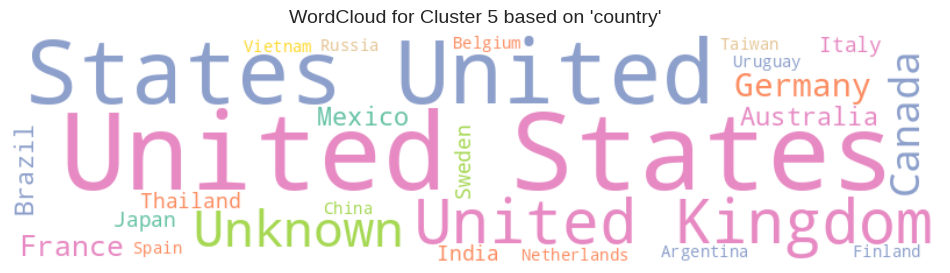

In [65]:
# For 'country'
plot_wordclouds(cluster_col='agg_hierarchical_cluster', text_col='country')

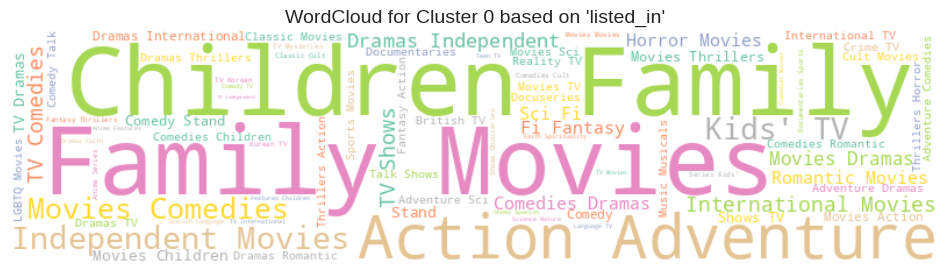

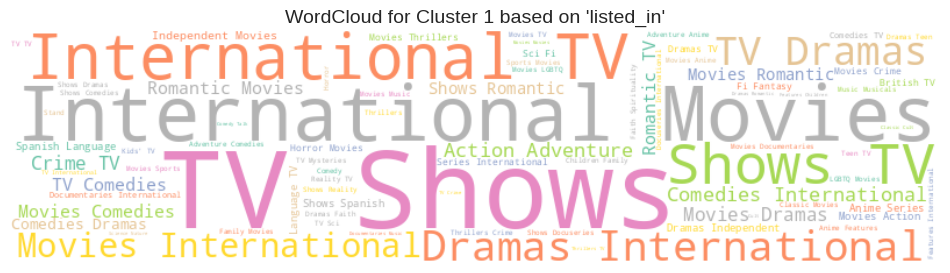

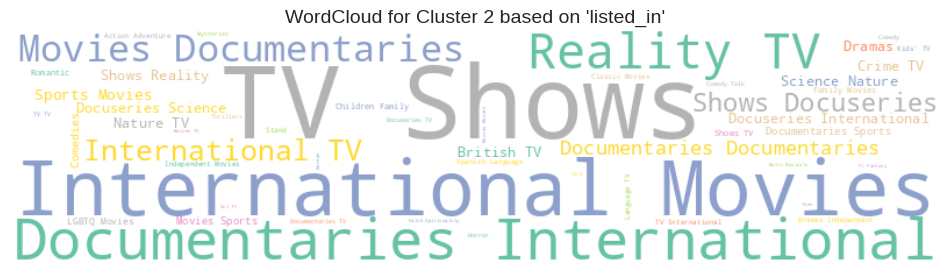

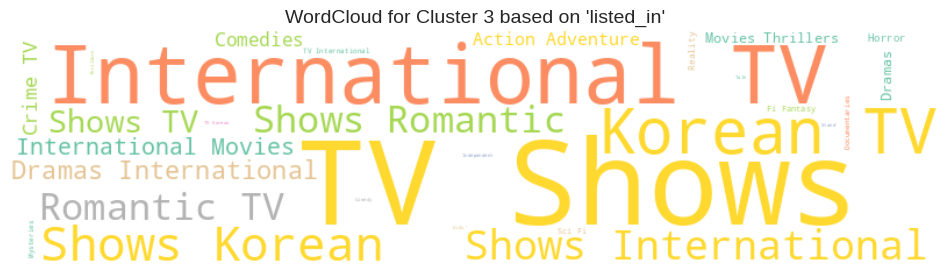

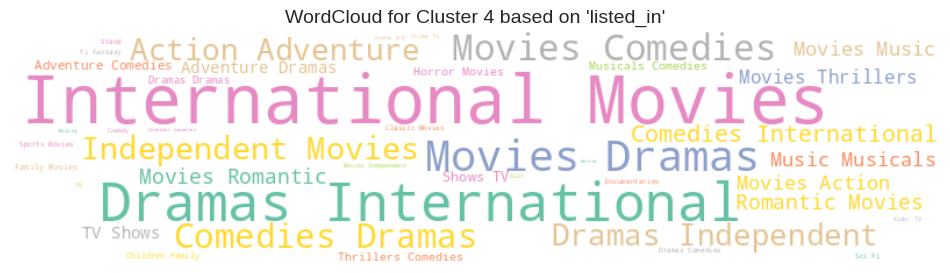

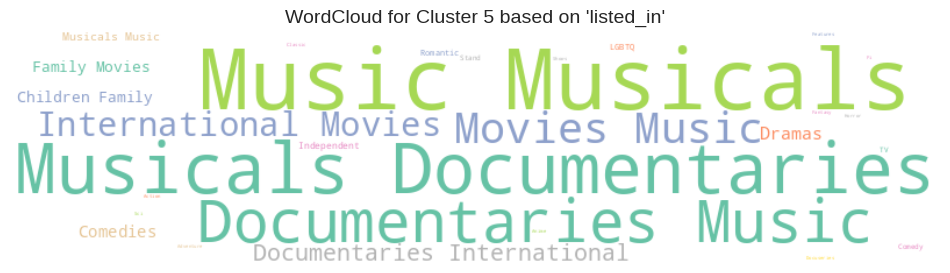

In [66]:
# For 'listed_in' (genres)
plot_wordclouds(cluster_col='agg_hierarchical_cluster', text_col='listed_in')

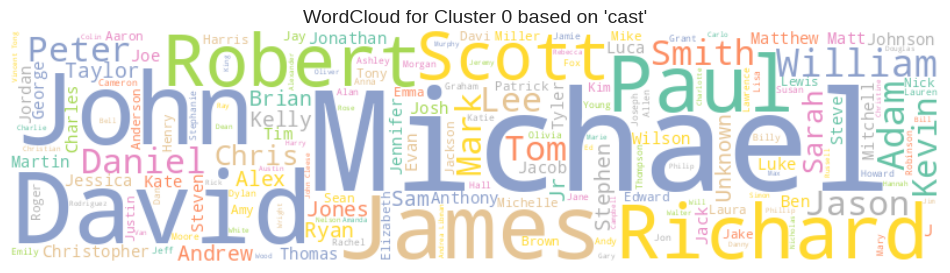

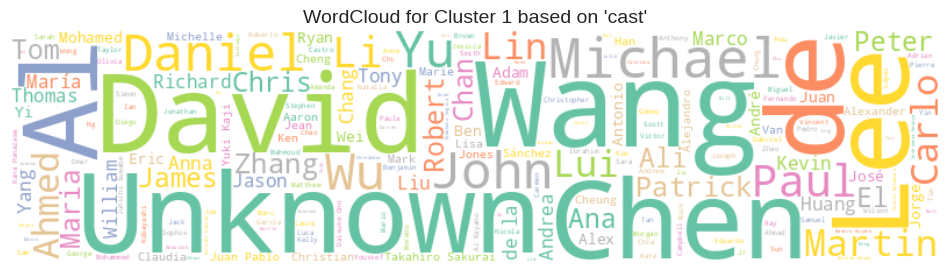

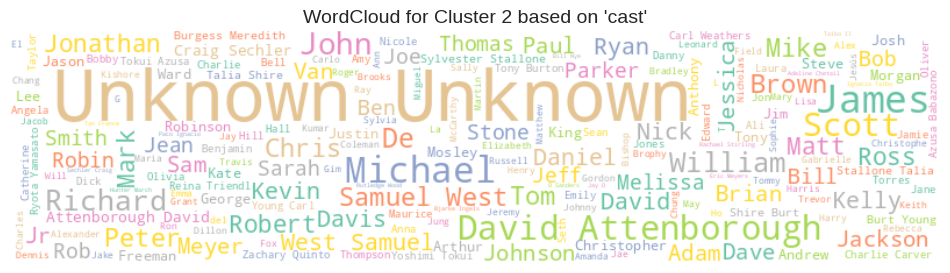

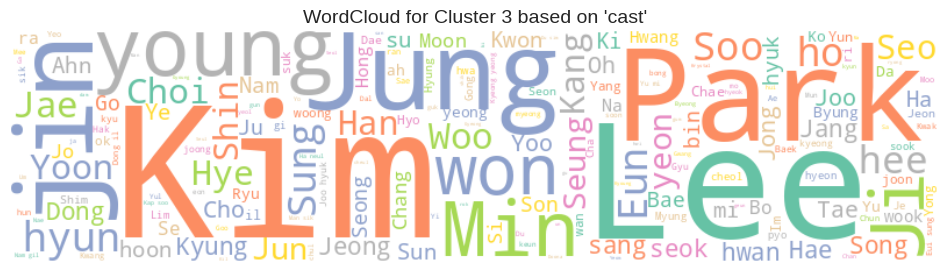

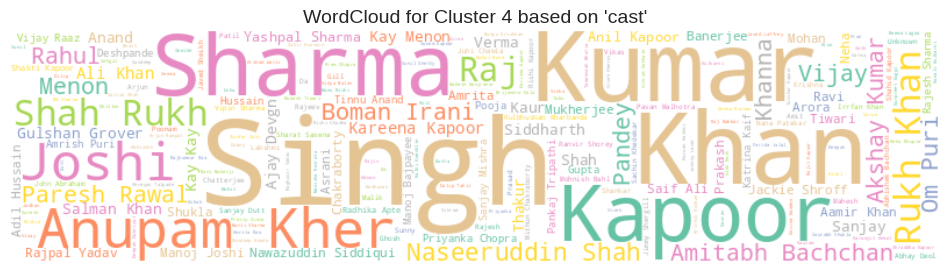

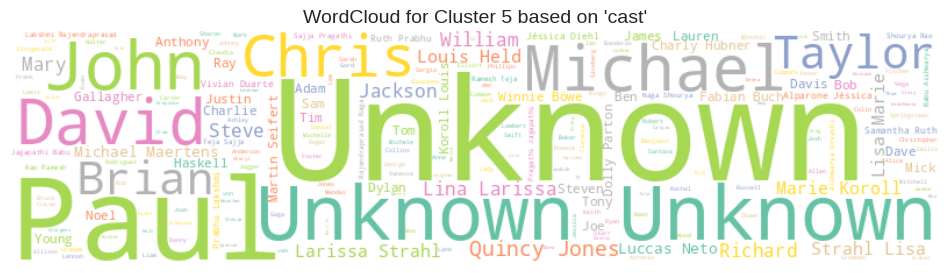

In [67]:
# For 'cast' (genres)
plot_wordclouds(cluster_col='agg_hierarchical_cluster', text_col='cast')

### ML Model - 3  Building a Recommendaton System - Content-based recommendation systems

**Content-based recommendation systems** recommend items to a user by using the similarity of items. This recommender system recommends products or items based on their description or features. It identifies the similarity between the products based on their descriptions.

It short notes which items a particular user likes and also the items that the users with behavior and likings like him/her likes, to recommend items to that user.

**Cosine Similarity**
is a metric used to measure how similar two vectors are, regardless of their magnitude. It is especially useful in text analysis and machine learning when working with high-dimensional sparse data, such as word embeddings, TF-IDF vectors, or other vectorized text data.

Magnitude doesn't matter: Only direction is considered, so two documents with the same words but different word counts can still be similar.

Perfect for sparse data: Works well with TF-IDF or one-hot encoded vectors.

Range: Values range from:-  +1: exactly the same , 0: orthogonal (completely different)  , -1: exactly opposite (rare in NLP)



In [69]:
# defining new dataframe for building recommandation system
recommendaton_df = df.copy()

In [70]:
recommendaton_df.head(3)

,show_id,type,title,director,cast,country,release_year,rating,duration,listed_in,description,year_added,month_added,tags,pos_tagging,cluster,agg_hierarchical_cluster
0,s1,TV Show,3%,Unknown,"João Miguel, Bianca Comparato, Michel Gomes, R...",Brazil,2020,TV-MA,4 Seasons,"International TV Shows, TV Dramas, TV Sci-Fi &...",In a future where the elite inhabit an island ...,2020,8,futur elit inhabit island paradis far crowd sl...,"[(futur, NN), (elit, NN), (inhabit, NN), (isla...",1,1
1,s2,Movie,7:19,Jorge Michel Grau,"Demián Bichir, Héctor Bonilla, Oscar Serrano, ...",Mexico,2016,TV-MA,93 min,"Dramas, International Movies",After a devastating earthquake hits Mexico Cit...,2016,12,devast earthquak hit mexico citi trap survivor...,"[(devast, NN), (earthquak, NN), (hit, VBD), (m...",3,0
2,s3,Movie,23:59,Gilbert Chan,"Tedd Chan, Stella Chung, Henley Hii, Lawrence ...",Singapore,2011,R,78 min,"Horror Movies, International Movies","When an army recruit is found dead, his fellow...",2018,12,armi recruit found dead fellow soldier forc co...,"[(armi, NN), (recruit, NN), (found, VBN), (dea...",3,1


In [71]:
# Importing neede libraries
from sklearn.metrics.pairwise import cosine_similarity

# Create a TF-IDF vectorizer object and transform the text data
tfidfVe = TfidfVectorizer(stop_words='english')
# Fit the Algorithm
tfidf_matrix = tfidfVe.fit_transform(df['tags'])

# Compute cosine similarity matrix
cosine_sim = cosine_similarity(tfidf_matrix)
# Function to get recommendations
def get_recommendations(title, cosine_sim=cosine_sim):
    matches = recommendaton_df[recommendaton_df['title'].str.lower() == title.lower()]
    if matches.empty:
        return f"'{title}' not found in the dataset."

    idx = matches.index[0]
    sim_scores = list(enumerate(cosine_sim[idx]))
    #This sorts the similarity scores in descending order, so the most similar items are at the top.
    sim_scores = sorted(sim_scores, key=lambda x: x[1], reverse=True)
    sim_scores = sim_scores[1:6]  # Top 5 similar movies

    print(f"\nRecommended movies for '{title}':\n")
    print(f"{'Movie Title':<40} Similarity Score")
    print("-" * 60)

    for i, score in sim_scores:
        movie_title = recommendaton_df['title'].iloc[i]
        print(f"{movie_title:<40} {score:.4f}")
# def get_recommendations(title, cosine_sim = cosine_sim):
#     matches = recommendaton_df[recommendaton_df['title'].str.lower() == title.lower()]
#     if matches.empty:
#         return f"'{title}' not found in the dataset."

#     print(f"Recommended movies for '{title}':")

#     idx = matches.index[0]
#     sim_scores = list(enumerate(cosine_sim[idx]))
#     sim_scores = sorted(sim_scores, key=lambda x: x[1], reverse=True)
#     sim_scores = sim_scores[1:6]  # Top 5 similar movies
#     movie_indices = [i[0] for i in sim_scores]
#     return print(recommendaton_df['title'].iloc[movie_indices])


In [72]:
# Get recommendations for a movie
get_recommendations('Phir Hera Pheri')


Recommended movies for 'Phir Hera Pheri':

Movie Title                              Similarity Score
------------------------------------------------------------
Seth Rogen's Hilarity for Charity        0.1714
Superbad                                 0.1625
The Adderall Diaries                     0.1619
The Disaster Artist                      0.1274
Zack and Miri Make a Porno               0.1175


In [73]:
# Get recommendations for a TV Show
get_recommendations('Dharmakshetra')


Recommended movies for 'Dharmakshetra':

Movie Title                              Similarity Score
------------------------------------------------------------
Dogs                                     0.1227
Jaane Tu... Ya Jaane Na                  0.1119
What Are the Odds?                       0.1077
Fireflies                                0.1064
Love Aaj Kal                             0.1045


In [74]:
# Get recommendations for a movie other country 'United States'
get_recommendations('Zack and Miri Make a Porno')


Recommended movies for 'Zack and Miri Make a Porno':

Movie Title                              Similarity Score
------------------------------------------------------------
Magi: The Labyrinth of Magic             0.2049
JoJo's Bizarre Adventure                 0.1929
March Comes in Like a Lion               0.1735
Haikyu!!                                 0.1626
K                                        0.1597


In [75]:
# Get recommendations for a TV Show  other country 'United States'
get_recommendations('7 Days Out')


Recommended movies for '7 Days Out':

Movie Title                              Similarity Score
------------------------------------------------------------
Zindagi Gulzar Hai                       0.2039
Ho Mann Jahaan                           0.2006
Chupan Chupai                            0.1774
Sadqay Tumhare                           0.1743
Kajraare                                 0.1573


In [ ]:
print(recommendaton_df['title'])  # or use .unique()

In [ ]:
movie = recommendaton_df[recommendaton_df['type'] == 'Movie']

In [ ]:
tvShow= recommendaton_df[recommendaton_df['type'] == 'TV Show']

### 1. Which Evaluation metrics did you consider for a positive business impact and why?

For evaluating the **recommendation system based on content-based filtering using TF-IDF and cosine similarity**, the following evaluation metrics are considered to measure positive business impact.

### 2. Which ML model did you choose from the above created models as your final prediction model and why?

We have choose form **K-means** as our final model, as we are getting the comparatevely high Silhoutte Score in K-means clustering.

## ***8.*** ***Future Work (Optional)***

### 1. Save the best performing ml model in a pickle file or joblib file format for deployment process.


In [77]:
# Save the File
import pickle

# Serialize process (wb=write byte)
# Save the best model (kmeans Clustering)
pickle.dump(kmeans,open('kmeans_model.pkl','wb'))

### 2. Again Load the saved model file and try to predict unseen data for a sanity check.


In [78]:
# Load the File and predict unseen data.
load_pickled_model= pickle.load(open('kmeans_model.pkl','rb'))

# Predicting the unseen data
load_pickled_model.predict(X_reduced)

array([1, 3, 3, ..., 4, 1, 4], dtype=int32)

In [79]:
# old output y_kmeans
y_kmeans

array([1, 3, 3, ..., 4, 1, 4], dtype=int32)

### ***Congrats! Your model is successfully created and ready for deployment on a live server for a real user interaction !!!***

# **Conclusion**

**Insights from EDA**


* 🎬 **Content Composition:-** In this data-set there are two types of contents .
    * The has **Movies for approximately 69.1% (5372)** of the content.
    * The has **TV Shows for approximately 30.9% (2398)** of the content.

* 🌍**Country-wise Contribution:-** 📍The **United States is the largest** contributor of content with **1,847 movies and 699 TV shows**.
    * **India follows as the second-largest** contributor, providing **852 movies/TV Shows**.
    * Other countries have a **medium to low level of contribution** compared to the United States and India, highlighting a significant content gap.
* 📺**Content Ratings**:- The Movie/TV Shows highlighting content ratings Yong Adults and Famiily data available.
* 🏷️**Genre Trends**:- Top **genres: International Movies, Dramas, Comedies, and Documentaries**. A clear audience interest in diverse, global, and emotionally engaging genres.
* 🕒 **Duration and Seasons:-** Movies mostly range between 80–120 minutes, peaking at **~90 minutes88. TV Shows often last 1–2 seasons, with **1 season being the most frequent**.

* 📅 **Release Trends:-** A most content year 2007 to 2021 Movies/TV shows.
* 📈 **Content Growth Over Time:-** A sharp increase in content additions **began in 2015, peaking between 2016 and 2020**.

* **This insights can guide content strategy, regional expansion offering business impact in terms of audience retention, content investment, and market penetration.**


**Insights from Machine Learning Model**

* Text data for analysis or modeling (NLP) textual data preprocessing I used stop words, removed punctuation's , stemming & TF-IDF vectorizer and other functions of NLP.

* Implemented **K-Means Clustering and Agglomerative Hierarchical Clustering**, to cluster the Netflix Movies TV show dataset.
* The optimal number of clusters we are getting from **K-means is 6**, whereas for **Agglomerative Hierarchical Clustering the optimal number of clusters are found out to be 6**.
* We chose **Silhouette Score as the evaluation metric** over distortion score because it provides a more intuitive and interpretable result. Also Silhouette score is less sensitive to the shape of the clusters.

*  Built a **Recommendation system** content-based recommendation system leveraging cosine similarity scores computed on TF-IDF vectors.

* Improve user experience by suggesting similar shows/movies based on previous interactions.




### ***Hurrah! You have successfully completed your Machine Learning Capstone Project !!!***